### Importing the necessary Libraries

In [369]:
# pip install -U imbalanced-learn
#!pip install gensim
#!pip install -U pandas
#!pip install torch torchvision torchaudio transformers
#!pip install accelerate -U
#!pip install transformers[torch]
#!pip install h5py

In [3]:
import transformers
print(transformers.__version__)

4.31.0


In [375]:
import warnings
warnings.filterwarnings("ignore") # code to ignore all warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import nltk
nltk.download('stopwords') # downloading stopwords from nltk
nltk.download('punkt')     # downloading punkt from nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('wordnet')
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score, log_loss,roc_curve, auc,RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay,ConfusionMatrixDisplay
from imblearn.over_sampling import RandomOverSampler
from collections import OrderedDict
from gensim.models import Word2Vec
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
import joblib
import h5py


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nikde\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\nikde\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\nikde\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


ImportError: DLL load failed while importing _errors: The specified procedure could not be found.

In [5]:
# Setting a pandas configuration option to show full content of a column, no matter how long the values are.
pd.set_option('display.max_colwidth', None)

### Loading the dataset

In [7]:
# Loading the train_product_data using pandas's read_csv()
df = pd.read_csv("C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/data/rawdata/train_product_data.csv")

In [8]:
# Checking the first 5 rows
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-cycling-shorts/p/itmeh2ffvzetthbb?pid=SRTEH2FF9KEDEFGF,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/altht-3p-21-alisha-38-original-imaeh2d5vm5zbtgg.jpeg"", ""http://img5a.flixcart.com/image/short/p/j/z/altght4p-26-alisha-38-original-imaeh2d5kbufss6n.jpeg"", ""http://img5a.flixcart.com/image/short/p/j/z/altght4p-26-alisha-38-original-imaeh2d5npdybzyt.jpeg"", ""http://img5a.flixcart.com/image/short/z/j/7/altght-7-alisha-38-original-imaeh2d5jsz2ghd6.jpeg""]",False,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 3""}, {""key""=>""Fabric"", ""value""=>""Cotton Lycra""}, {""key""=>""Type"", ""value""=>""Cycling Shorts""}, {""key""=>""Pattern"", ""value""=>""Solid""}, {""key""=>""Ideal For"", ""value""=>""Women's""}, {""value""=>""Gentle Machine Wash in Lukewarm Water, Do Not Bleach""}, {""key""=>""Style Code"", ""value""=>""ALTHT_3P_21""}, {""value""=>""3 shorts""}]}"
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grgfbkexnt?pid=SHOEH4GRSUBJGZXE,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/red-as-454-aw-11-original-imaeebfwsdf6jdf6.jpeg"", ""http://img6a.flixcart.com/image/shoe/7/z/z/red-as-454-aw-11-original-imaeebfwsdf6jdf6.jpeg"", ""http://img5a.flixcart.com/image/shoe/7/z/z/red-as-454-aw-11-original-imaeebfwt8zqc5cy.jpeg"", ""http://img5a.flixcart.com/image/shoe/7/z/z/red-as-454-aw-11-original-imaeebfwhz5f8v6m.jpeg"", ""http://img6a.flixcart.com/image/shoe/7/z/z/red-as-454-aw-11-original-imaeeducshzc6pbz.jpeg"", ""http://img6a.flixcart.com/image/shoe/7/z/z/red-as-454-aw-11-original-imaeebfw2veeuz8s.jpeg""]",False,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For"", ""value""=>""Women""}, {""key""=>""Occasion"", ""value""=>""Casual""}, {""key""=>""Color"", ""value""=>""Red""}, {""key""=>""Outer Material"", ""value""=>""Patent Leather""}, {""key""=>""Heel Height"", ""value""=>""1 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 1""}, {""value""=>""One Pair Of Shoes""}]}"
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-cycling-shorts/p/itmeh2f6sdgah2pq?pid=SRTEH2F6HUZMQ6SJ,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/altght-11-alisha-38-original-imaeh2d5uq9thnyg.jpeg"", ""http://img6a.flixca

In [9]:
# Keeping only the essential columns which are description and product_category_tree
df = df[['description', 'product_category_tree']]

In [10]:
# checking the first 5 rows of df again
df.head()

,description,product_category_tree
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal For Women Shoe Details Weight 200 g (per single Shoe) - Weight of the product may vary depending on size. Heel Height 0 inch Outer Material Fabric Color Pink",Footwear


In [11]:
# Saving the filtered dataset
# Specify the file path where you want to save the file
file_path = os.path.join("C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/data/processeddata", "original_filtered_data.csv")

# Save the df dataframe as a CSV file
df.to_csv(file_path, index=False)  # Set index=False to avoid saving the DataFrame index

In [12]:
# checking the shape of df again
df.shape

(14999, 2)

In [13]:
# Looking at the information of df using info()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   description            14998 non-null  object
 1   product_category_tree  14999 non-null  object
dtypes: object(2)
memory usage: 234.5+ KB


In [14]:
# checking total number of duplicates
df.duplicated().sum()

1832

In [15]:
# checking for missing values
df.isna().sum() / len(df) * 100

description              0.006667
product_category_tree    0.000000
dtype: float64

In [16]:
# Imputing the missing values in the description column with it's mode
df['description'].fillna(df['description'].mode()[0], inplace = True)

In [17]:
# checking for missing values
df.isna().sum() / len(df) * 100

description              0.0
product_category_tree    0.0
dtype: float64

In [18]:
# Checking the class distribution of the target variable
df['product_category_tree'].value_counts()

product_category_tree
Clothing                       5316
Jewellery                      3218
Footwear                       1083
Automotive                      937
Mobiles & Accessories           768
Home Decor & Festive Needs      714
Kitchen & Dining                610
Computers                       531
Watches                         526
Tools & Hardware                379
Toys & School Supplies          271
Pens & Stationery               264
Baby Care                       224
Bags, Wallets & Belts           158
Name: count, dtype: int64

#### Plotting the target class distribution

In [20]:
# Define a folder to save visualizations
visuals_folder = "C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/visuals"

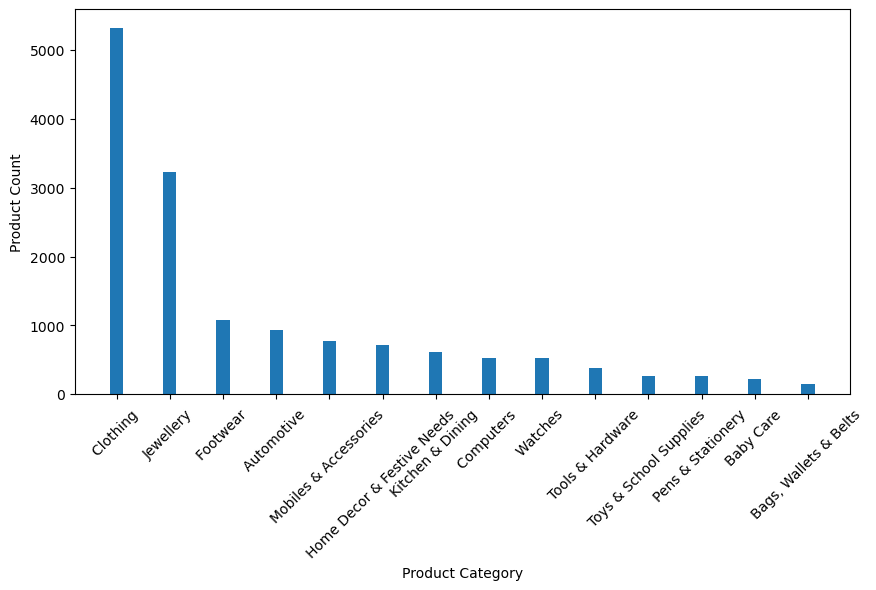

In [21]:
# check for the target class counts
label_dist = df['product_category_tree'].value_counts().to_dict()
fig = plt.figure(figsize = (10, 5))
ax = plt.bar(label_dist.keys(), label_dist.values(), width=0.25)
plt.xticks(rotation = 45)
plt.xlabel("Product Category")
plt.ylabel("Product Count")
# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "initial_product_category_distribution.png"))
plt.show()

#### Since the target variable is hugely imbalanced, we need to perform oversampling on the minority classes to fix this imbalance.

In [23]:
# Separate features and target
X = df[['description']]  
y = df['product_category_tree']

# Initialize the RandomOverSampler
oversampler = RandomOverSampler(sampling_strategy='auto')

# Apply Random Oversampling
X_resampled, y_resampled = oversampler.fit_resample(X, y)

# Combine the resampled features and target back into a single DataFrame
df_resampled = X_resampled.copy()
df_resampled['product_category_tree'] = y_resampled

# Verify the new class distribution
print(df_resampled['product_category_tree'].value_counts())

product_category_tree
Clothing                       5316
Footwear                       5316
Pens & Stationery              5316
Bags, Wallets & Belts          5316
Home Decor & Festive Needs     5316
Automotive                     5316
Tools & Hardware               5316
Baby Care                      5316
Mobiles & Accessories          5316
Watches                        5316
Toys & School Supplies         5316
Jewellery                      5316
Kitchen & Dining               5316
Computers                      5316
Name: count, dtype: int64


#### Plotting the target class distribution after oversampling

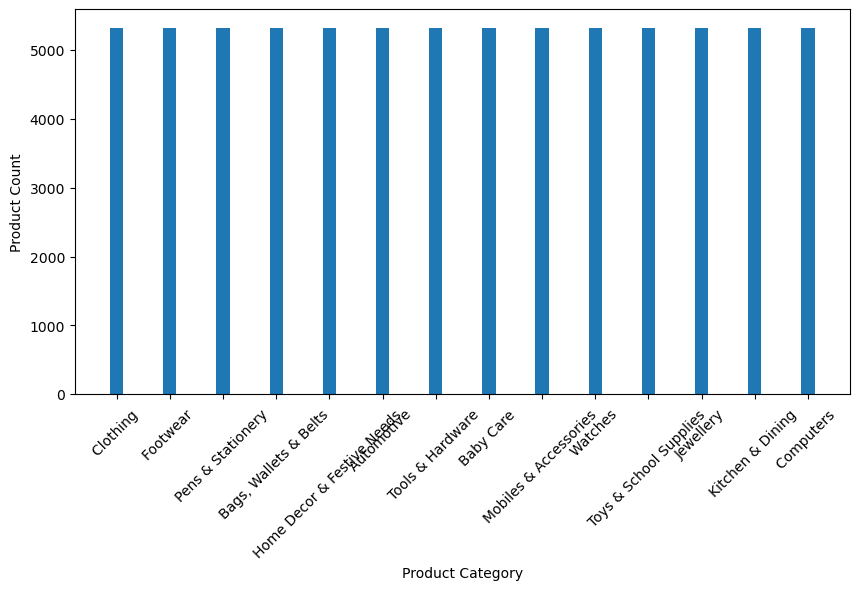

In [25]:
# check for the target class counts
label_dist = df_resampled['product_category_tree'].value_counts().to_dict()
fig = plt.figure(figsize = (10, 5))
ax = plt.bar(label_dist.keys(), label_dist.values(), width=0.25)
plt.xticks(rotation = 45)
plt.xlabel("Product Category")
plt.ylabel("Product Count")
# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "resampled_product_category_distribution.png"))
plt.show()

#### Now the target variable is well balanced and we can proceed ahead.

In [27]:
# checking the shape of df_resampled
df_resampled.shape

(74424, 2)

In [28]:
# looking at the the information of df_resampled using info() 
df_resampled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74424 entries, 0 to 74423
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   description            74424 non-null  object
 1   product_category_tree  74424 non-null  object
dtypes: object(2)
memory usage: 1.1+ MB


In [29]:
# checking the first 5 rows of df_resampled
df_resampled.head()

,description,product_category_tree
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal For Women Shoe Details Weight 200 g (per single Shoe) - Weight of the product may vary depending on size. Heel Height 0 inch Outer Material Fabric Color Pink",Footwear


In [30]:
# Saving the resampled dataset
# Specify the file path where you want to save the file
file_path = os.path.join("C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/data/processeddata", "resampled_data.csv")

# Save the df_resampled dataframe as a CSV file
df_resampled.to_csv(file_path, index=False)  # Set index=False to avoid saving the DataFrame index

In [31]:
df_resampled.isna().sum() /len(df_resampled) * 100

description              0.0
product_category_tree    0.0
dtype: float64

In [32]:
# Convert all values in 'description' column to string type
df_resampled['description'] = df_resampled['description'].astype(str)

In [33]:
df_resampled.dtypes

description              object
product_category_tree    object
dtype: object

In [34]:
# checking the total duplicates after resampling
df_resampled.duplicated().sum()

61257

In [35]:
# looking at the information of df_resampled using info()
df_resampled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74424 entries, 0 to 74423
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   description            74424 non-null  object
 1   product_category_tree  74424 non-null  object
dtypes: object(2)
memory usage: 1.1+ MB


In [36]:
# add a new column for the length of the reveiws
df_resampled['length']=df_resampled['description'].apply(lambda x: len(x.split(' ')))

In [37]:
# checking the first 5 rows after adding the length column
df_resampled.head()

,description,product_category_tree,length
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing,64
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear,107
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing,63
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing,65
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal For Women Shoe Details Weight 200 g (per single Shoe) - Weight of the product may vary depending on size. Heel Height 0 inch Outer Material Fabric Color Pink",Footwear,64


In [38]:
# checking the names of the different categories
df_resampled['product_category_tree'].unique()

array(['Clothing ', 'Footwear ', 'Pens & Stationery ',
       'Bags, Wallets & Belts ', 'Home Decor & Festive Needs ',
       'Automotive ', 'Tools & Hardware ', 'Baby Care ',
       'Mobiles & Accessories ', 'Watches ', 'Toys & School Supplies ',
       'Jewellery ', 'Kitchen & Dining ', 'Computers '], dtype=object)

In [39]:
# Creating a dataframe to store the mean length of each category
results = []
for x in df_resampled['product_category_tree'].unique():
    mean_length = round(df_resampled[df_resampled['product_category_tree']==x]['length'].mean())
    results.append({'Category' : x, 'MeanLength' : mean_length})
    
mean_length_df = pd.DataFrame(results)

In [40]:
# checking the mean_length_df dataframe
mean_length_df

,Category,MeanLength
0,Clothing,64
1,Footwear,53
2,Pens & Stationery,55
3,"Bags, Wallets & Belts",85
4,Home Decor & Festive Needs,101
5,Automotive,82
6,Tools & Hardware,57
7,Baby Care,76
8,Mobiles & Accessories,126
9,Watches,58


#### Plotting the Mean Length for each category

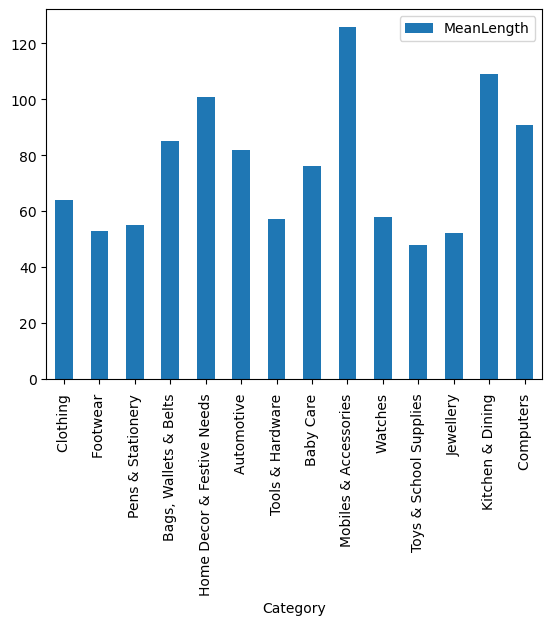

In [42]:
mean_length_df.plot(kind = 'bar', x = 'Category', y = 'MeanLength')
# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "Mean Length of Description by Category.png"))
plt.show()

#### We can see that the mean description lenghts for most categories are in the range of 40-120

#### Plotting the distribution based on the length of the descriptions for each category

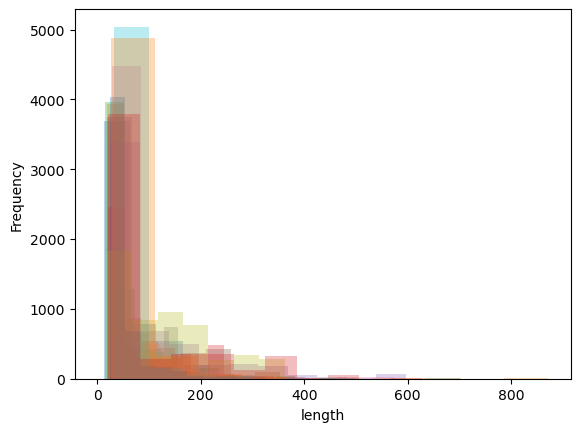

In [45]:
df_resampled[df_resampled['product_category_tree']=='Clothing ']['length'].plot.hist(bins=10, alpha=0.3, label="Clothing")
df_resampled[df_resampled['product_category_tree']=='Footwear ']['length'].plot.hist(bins=10, alpha=0.3, label="Footwear")
df_resampled[df_resampled['product_category_tree']=='Pens & Stationery ']['length'].plot.hist(bins=10, alpha=0.3, label="Pens & Stationery")
df_resampled[df_resampled['product_category_tree']=='Bags, Wallets & Belts ']['length'].plot.hist(bins=10, alpha=0.3, label="Bags, Wallets & Belts")
df_resampled[df_resampled['product_category_tree']=='Home Decor & Festive Needs ']['length'].plot.hist(bins=10, alpha=0.3, label="Home Decor & Festive Needs")
df_resampled[df_resampled['product_category_tree']=='Automotive ']['length'].plot.hist(bins=10, alpha=0.3, label="Automotive")
df_resampled[df_resampled['product_category_tree']=='Tools & Hardware ']['length'].plot.hist(bins=10, alpha=0.3, label="Tools & Hardware")
df_resampled[df_resampled['product_category_tree']=='Baby Care ']['length'].plot.hist(bins=10, alpha=0.3, label="Baby Care")
df_resampled[df_resampled['product_category_tree']=='Mobiles & Accessories ']['length'].plot.hist(bins=10, alpha=0.3, label="Mobiles & Accessories")
df_resampled[df_resampled['product_category_tree']=='Watches ']['length'].plot.hist(bins=10, alpha=0.3, label="Watches")
df_resampled[df_resampled['product_category_tree']=='Toys & School Supplies ']['length'].plot.hist(bins=10, alpha=0.3, label="Toys & School Supplies ")
df_resampled[df_resampled['product_category_tree']=='Jewellery ']['length'].plot.hist(bins=10, alpha=0.3, label="Jewellery ")
df_resampled[df_resampled['product_category_tree']=='Kitchen & Dinning ']['length'].plot.hist(bins=10, alpha=0.3, label="Kitchen & Dinning")
df_resampled[df_resampled['product_category_tree']=='Computers ']['length'].plot.hist(bins=10, alpha=0.3, label="Computers")
plt.xlabel("length")
# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "Initial_ Description_Length_Distribution.png"))
plt.show()

#### We can see that most of the Description lengths are in the range of 10 - 100 

In [47]:
# getting the stopwords of the english language and storing it as a set
STOPWORDS = set(stopwords.words('english'))

In [48]:
STOPWORDS

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [49]:
# Removing stopwords from the descriptions and storing the cleaned description in a different column
df_resampled["clean_description"]=df_resampled["description"].apply(lambda x: ' '.join([word for word in x.split() if word not in (STOPWORDS)]))

In [50]:
# defining a function for content cleaning
def text_clean(content):
    #lowercase the content
    content=content.lower()
    #remove punctuation
    content = re.sub('[()!?]', ' ', content)
    content = re.sub('\[.*?\]',' ', content)
    #remove non alphanumeric occurences
    content = re.sub("[^a-z0-9]"," ", content)
    #remove the @mention
    content = re.sub("@[A-Za-z0-9_]+","", content)
    #remove the hashtags
    content = re.sub("#[A-Za-z0-9_]+","", content)
    #remove any links
    content = re.sub(r"http\S+", "", content)
    content = re.sub(r"www.\S+", "", content)
    return content

In [51]:
# apply the function on the clean_description column
df_resampled['clean_description'] = df_resampled['clean_description'].apply(text_clean)

In [52]:
# dropping the length column
df_resampled = df_resampled.drop('length', axis = 1)

In [53]:
# add back the length of the cleaned descriptions after the cleaned descriptions column
df_resampled['length']=df_resampled['clean_description'].apply(lambda x: len(x.split(' ')))

In [54]:
# checking the change in the lengths after cleaning
df_resampled.head()

,description,product_category_tree,clean_description,length
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing,key features alisha solid women s cycling shorts cotton lycra navy red navy specifications alisha solid women s cycling shorts shorts details number contents sales package pack 3 fabric cotton lycra type cycling shorts general details pattern solid ideal for women s fabric care gentle machine wash lukewarm water do not bleach additional details style code altht 3p 21 in box 3 shorts,66
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear,key features aw bellies sandals wedges heel casuals aw bellies price rs 499 material synthetic lifestyle casual heel type wedge warranty type manufacturer product warranty manufacturing defects 30 days care instructions allow pair shoes air de odorize regular basis use shoe bags prevent stains mildew dust dry dirt surface using clean cloth use polish shiner specifications aw bellies general ideal for women occasion casual shoe details color red outer material patent leather heel height 1 inch number contents sales package pack 1 in box one pair of shoes,99
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing,key features alisha solid women s cycling shorts cotton lycra black red specifications alisha solid women s cycling shorts shorts details number contents sales package pack 2 fabric cotton lycra type cycling shorts general details pattern solid ideal for women s fabric care gentle machine wash lukewarm water do not bleach additional details style code altght 11 in box 2 shorts,63
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing,key features alisha solid women s cycling shorts cotton lycra navy red white red specifications alisha solid women s cycling shorts shorts details number contents sales package pack 4 fabric cotton lycra type cycling shorts general details pattern solid ideal for women s in box 4 shorts additional details style code altght4p 26 fabric care gentle machine wash lukewarm water do not bleach,67
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal Fo

In [55]:
# removing the stop words again because of new words created after applying the text_clean function
df_resampled["clean_description"]=df_resampled["clean_description"].apply(lambda x: ' '.join([word for word in x.split() if word not in (STOPWORDS)]))

In [56]:
# apply the text clean function again on the clean_description column
df_resampled['clean_description'] = df_resampled['clean_description'].apply(text_clean)

In [57]:
# update the length of the descriptions
df_resampled['length']=df_resampled['clean_description'].apply(lambda x: len(x.split(' ')))

In [58]:
# checking the reduction in the description lengths after second round of cleaning
df_resampled.head()

,description,product_category_tree,clean_description,length
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing,key features alisha solid women cycling shorts cotton lycra navy red navy specifications alisha solid women cycling shorts shorts details number contents sales package pack 3 fabric cotton lycra type cycling shorts general details pattern solid ideal women fabric care gentle machine wash lukewarm water bleach additional details style code altht 3p 21 box 3 shorts,56
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear,key features aw bellies sandals wedges heel casuals aw bellies price rs 499 material synthetic lifestyle casual heel type wedge warranty type manufacturer product warranty manufacturing defects 30 days care instructions allow pair shoes air de odorize regular basis use shoe bags prevent stains mildew dust dry dirt surface using clean cloth use polish shiner specifications aw bellies general ideal women occasion casual shoe details color red outer material patent leather heel height 1 inch number contents sales package pack 1 box one pair shoes,85
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing,key features alisha solid women cycling shorts cotton lycra black red specifications alisha solid women cycling shorts shorts details number contents sales package pack 2 fabric cotton lycra type cycling shorts general details pattern solid ideal women fabric care gentle machine wash lukewarm water bleach additional details style code altght 11 box 2 shorts,54
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing,key features alisha solid women cycling shorts cotton lycra navy red white red specifications alisha solid women cycling shorts shorts details number contents sales package pack 4 fabric cotton lycra type cycling shorts general details pattern solid ideal women box 4 shorts additional details style code altght4p 26 fabric care gentle machine wash lukewarm water bleach,56
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal For Women Shoe Details Weight 200 g (per single Shoe) - Weight of the pr

In [59]:
# Function to remove duplicate words while preserving order
def remove_duplicate_words(text):
    words = text.split()  # Split the text into words
    unique_words = list(OrderedDict.fromkeys(words))  # Use OrderedDict to maintain order
    return ' '.join(unique_words)  # Join the list back into a string

In [60]:
# Apply the function to the cleaned product descriptions
df_resampled['clean_description'] = df_resampled['clean_description'].apply(remove_duplicate_words)

In [61]:
# update the length of the descriptions after removing duplicate words
df_resampled['length']=df_resampled['clean_description'].apply(lambda x: len(x.split(' ')))

In [62]:
# checking the df_resampled data frame after removing dupliacte words
df_resampled.head()

,description,product_category_tree,clean_description,length
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing,key features alisha solid women cycling shorts cotton lycra navy red specifications details number contents sales package pack 3 fabric type general pattern ideal care gentle machine wash lukewarm water bleach additional style code altht 3p 21 box,38
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear,key features aw bellies sandals wedges heel casuals price rs 499 material synthetic lifestyle casual type wedge warranty manufacturer product manufacturing defects 30 days care instructions allow pair shoes air de odorize regular basis use shoe bags prevent stains mildew dust dry dirt surface using clean cloth polish shiner specifications general ideal women occasion details color red outer patent leather height 1 inch number contents sales package pack box one,70
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing,key features alisha solid women cycling shorts cotton lycra black red specifications details number contents sales package pack 2 fabric type general pattern ideal care gentle machine wash lukewarm water bleach additional style code altght 11 box,37
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing,key features alisha solid women cycling shorts cotton lycra navy red white specifications details number contents sales package pack 4 fabric type general pattern ideal box additional style code altght4p 26 care gentle machine wash lukewarm water bleach,38
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal For Women Shoe Details Weight 200 g (per single Shoe) - Weight of the product may vary depending on size. Heel Height 0 inch Outer Material Fabric Color Pink",Footwear,key features dilli bazaaar bellies corporate casuals material fabric occasion ethnic casual party formal color pink heel height 0 specifications general ideal women shoe details weight 200 g per single product may vary depending size inch outer,37


In [63]:
# Saving the feature Engineered dataset
# Specify the file path where you want to save the file
file_path = os.path.join("C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/data/processeddata", "feature_engineered_data.csv")
# Save the df dataframe as a CSV file
df_resampled.to_csv(file_path, index=False)  # Set index=False to avoid saving the DataFrame index

In [64]:
# Creating a dataframe to store the mean length of each category
results = []
for x in df_resampled['product_category_tree'].unique():
    mean_length = round(df_resampled[df_resampled['product_category_tree']==x]['length'].mean())
    results.append({'Category' : x, 'MeanLength' : mean_length})
    
mean_length_df = pd.DataFrame(results)

In [65]:
mean_length_df

,Category,MeanLength
0,Clothing,28
1,Footwear,28
2,Pens & Stationery,32
3,"Bags, Wallets & Belts",46
4,Home Decor & Festive Needs,40
5,Automotive,40
6,Tools & Hardware,27
7,Baby Care,40
8,Mobiles & Accessories,44
9,Watches,32


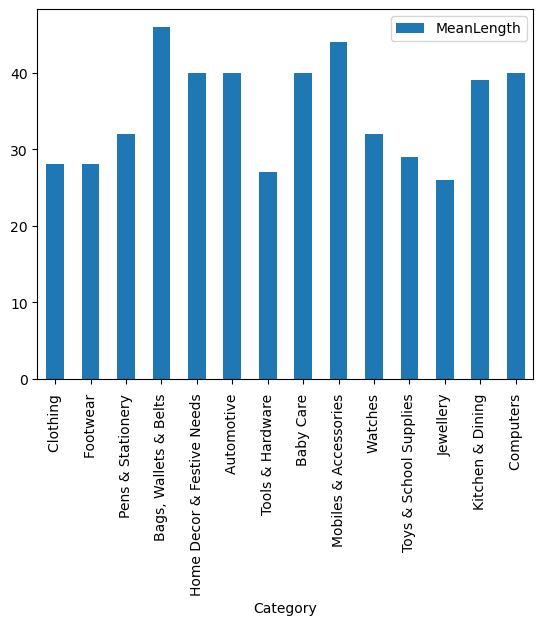

In [66]:
mean_length_df.plot(kind = 'bar', x = 'Category', y = 'MeanLength')
# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "Final Mean Length of Description by Category.png"))
plt.show()

#### After cleaning, the mean lengths of product descriptions have reduced to a great extent and are now in a range of 30-40 compared to 40-120.

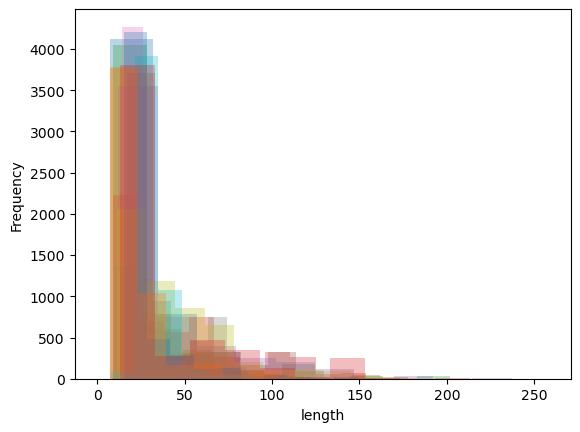

In [68]:
df_resampled[df_resampled['product_category_tree']=='Clothing ']['length'].plot.hist(bins=10, alpha=0.3, label="Clothing")
df_resampled[df_resampled['product_category_tree']=='Footwear ']['length'].plot.hist(bins=10, alpha=0.3, label="Footwear")
df_resampled[df_resampled['product_category_tree']=='Pens & Stationery ']['length'].plot.hist(bins=10, alpha=0.3, label="Pens & Stationery")
df_resampled[df_resampled['product_category_tree']=='Bags, Wallets & Belts ']['length'].plot.hist(bins=10, alpha=0.3, label="Bags, Wallets & Belts")
df_resampled[df_resampled['product_category_tree']=='Home Decor & Festive Needs ']['length'].plot.hist(bins=10, alpha=0.3, label="Home Decor & Festive Needs")
df_resampled[df_resampled['product_category_tree']=='Automotive ']['length'].plot.hist(bins=10, alpha=0.3, label="Automotive")
df_resampled[df_resampled['product_category_tree']=='Tools & Hardware ']['length'].plot.hist(bins=10, alpha=0.3, label="Tools & Hardware")
df_resampled[df_resampled['product_category_tree']=='Baby Care ']['length'].plot.hist(bins=10, alpha=0.3, label="Baby Care")
df_resampled[df_resampled['product_category_tree']=='Mobiles & Accessories ']['length'].plot.hist(bins=10, alpha=0.3, label="Mobiles & Accessories")
df_resampled[df_resampled['product_category_tree']=='Watches ']['length'].plot.hist(bins=10, alpha=0.3, label="Watches")
df_resampled[df_resampled['product_category_tree']=='Toys & School Supplies ']['length'].plot.hist(bins=10, alpha=0.3, label="Toys & School Supplies ")
df_resampled[df_resampled['product_category_tree']=='Jewellery ']['length'].plot.hist(bins=10, alpha=0.3, label="Jewellery ")
df_resampled[df_resampled['product_category_tree']=='Kitchen & Dinning ']['length'].plot.hist(bins=10, alpha=0.3, label="Kitchen & Dinning")
df_resampled[df_resampled['product_category_tree']=='Computers ']['length'].plot.hist(bins=10, alpha=0.3, label="Computers")
plt.xlabel("length")
# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "Final_ Description_Length_Distribution.png"))
plt.show()

#### After cleaning we can see that most of the Description lengths are in the range of 10 - 40

In [70]:
df_resampled.head()

,description,product_category_tree,clean_description,length
0,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",Clothing,key features alisha solid women cycling shorts cotton lycra navy red specifications details number contents sales package pack 3 fabric type general pattern ideal care gentle machine wash lukewarm water bleach additional style code altht 3p 21 box,38
1,"Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number of Contents in Sales Package Pack of 1 In the Box One Pair Of Shoes",Footwear,key features aw bellies sandals wedges heel casuals price rs 499 material synthetic lifestyle casual type wedge warranty manufacturer product manufacturing defects 30 days care instructions allow pair shoes air de odorize regular basis use shoe bags prevent stains mildew dust dry dirt surface using clean cloth polish shiner specifications general ideal women occasion details color red outer patent leather height 1 inch number contents sales package pack box one,70
2,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Black, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 2 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTGHT_11 In the Box 2 shorts",Clothing,key features alisha solid women cycling shorts cotton lycra black red specifications details number contents sales package pack 2 fabric type general pattern ideal care gentle machine wash lukewarm water bleach additional style code altght 11 box,37
3,"Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, White, Red,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 4 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's In the Box 4 shorts Additional Details Style Code ALTGHT4P_26 Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach",Clothing,key features alisha solid women cycling shorts cotton lycra navy red white specifications details number contents sales package pack 4 fabric type general pattern ideal box additional style code altght4p 26 care gentle machine wash lukewarm water bleach,38
4,"Key Features of dilli bazaaar Bellies, Corporate Casuals, Casuals Material: Fabric Occasion: Ethnic, Casual, Party, Formal Color: Pink Heel Height: 0,Specifications of dilli bazaaar Bellies, Corporate Casuals, Casuals General Occasion Ethnic, Casual, Party, Formal Ideal For Women Shoe Details Weight 200 g (per single Shoe) - Weight of the product may vary depending on size. Heel Height 0 inch Outer Material Fabric Color Pink",Footwear,key features dilli bazaaar bellies corporate casuals material fabric occasion ethnic casual party formal color pink heel height 0 specifications general ideal women shoe details weight 200 g per single product may vary depending size inch outer,37


In [71]:
df_resampled['product_category_tree'].shape

(74424,)

### Performing Train Test Split

In [73]:
# Sentiment Classifier
# split the data into training and test set with balanced split based on target class
X_train, X_test, y_train, y_test = train_test_split(df_resampled["clean_description"],
                                                    df_resampled["product_category_tree"],test_size=0.2,
                                                    stratify=df_resampled['product_category_tree'])

In [74]:
# check the shape of train and test data
print(X_train.shape[0],X_test.shape[0])

59539 14885


In [75]:
# check the class balance in the training data
print(y_train.value_counts())

product_category_tree
Footwear                       4253
Home Decor & Festive Needs     4253
Watches                        4253
Toys & School Supplies         4253
Bags, Wallets & Belts          4253
Clothing                       4253
Jewellery                      4253
Kitchen & Dining               4253
Mobiles & Accessories          4253
Automotive                     4253
Tools & Hardware               4253
Pens & Stationery              4252
Baby Care                      4252
Computers                      4252
Name: count, dtype: int64


In [76]:
# There is no class imbalance

In [77]:
# check the target class balance in the test data
print(y_test.value_counts())

product_category_tree
Baby Care                      1064
Computers                      1064
Pens & Stationery              1064
Home Decor & Festive Needs     1063
Toys & School Supplies         1063
Mobiles & Accessories          1063
Clothing                       1063
Kitchen & Dining               1063
Footwear                       1063
Watches                        1063
Automotive                     1063
Tools & Hardware               1063
Bags, Wallets & Belts          1063
Jewellery                      1063
Name: count, dtype: int64


In [78]:
# checking X-train
X_train

58613    key features nitgen enbioaccess t5 hid time attendance access control door locks poweronethernet poe face fingerprint card password price rs 44 804 company limited korea frontline provider biometric recognition technology based hardware solutions offers wide range award winning products provides excellent support india related video specifications general brand lcd resolution 4 3 tft colour touchscreen scratch proof yes type identification method material stainless steel fiber read 10 40 mm touch keypad function keys clock absence return suitable home office far 0 battery built optional power ethernet multiple languages communication interface tcp ip wiegand 26 34 bit backup options usb real data push server manager software operating system win 2000 higher frr speed less 2 sec 1 n capacity 50000 display requirement 230v 50 hz model number name temperature temp 20 60 c humidity 90 125 khz dimensions weight kg height 15 6 cm shape etc may change per manufacturer policy width 19

### Performing WordEmbedding using Word2Vec

In [80]:
# Tokenize the descriptions
train_sentences = [word_tokenize(description.lower()) for description in X_train]
test_sentences = [word_tokenize(description.lower()) for description in X_test]

In [81]:
# checking train_sentences***
train_sentences

[['key',
  'features',
  'nitgen',
  'enbioaccess',
  't5',
  'hid',
  'time',
  'attendance',
  'access',
  'control',
  'door',
  'locks',
  'poweronethernet',
  'poe',
  'face',
  'fingerprint',
  'card',
  'password',
  'price',
  'rs',
  '44',
  '804',
  'company',
  'limited',
  'korea',
  'frontline',
  'provider',
  'biometric',
  'recognition',
  'technology',
  'based',
  'hardware',
  'solutions',
  'offers',
  'wide',
  'range',
  'award',
  'winning',
  'products',
  'provides',
  'excellent',
  'support',
  'india',
  'related',
  'video',
  'specifications',
  'general',
  'brand',
  'lcd',
  'resolution',
  '4',
  '3',
  'tft',
  'colour',
  'touchscreen',
  'scratch',
  'proof',
  'yes',
  'type',
  'identification',
  'method',
  'material',
  'stainless',
  'steel',
  'fiber',
  'read',
  '10',
  '40',
  'mm',
  'touch',
  'keypad',
  'function',
  'keys',
  'clock',
  'absence',
  'return',
  'suitable',
  'home',
  'office',
  'far',
  '0',
  'battery',
  'built',


In [82]:
# checking test_sentences
test_sentences

[['destudio',
  'tiny',
  'wall',
  'sticker',
  'price',
  'rs',
  '399',
  'size',
  '45cms',
  'x',
  '60cms',
  'bespoke',
  'customized',
  'stickers',
  'good',
  'add',
  'decor',
  'regular',
  'walls',
  'easily',
  'removable',
  'comes',
  'great',
  'options',
  'e',
  'g',
  'color',
  'directions',
  'customization',
  'flip',
  'also',
  'available',
  'request',
  'details',
  'please',
  'contact',
  'support',
  'application',
  'surfaces',
  'applied',
  'almost',
  'smooth',
  'surface',
  'including',
  'wallpaper',
  'paint',
  'glass',
  'windows',
  'metal',
  'plastic',
  'wood',
  'tiles',
  'mirrors',
  'drywall',
  'plaster',
  'laptops',
  'cars',
  'boats',
  'vans',
  'vehicles',
  'durability',
  'using',
  'premium',
  'quality',
  'pvc',
  'vinyl',
  'films',
  'last',
  '10',
  'years',
  'indoors',
  'removing',
  'matt',
  'finish',
  'removed',
  'anytime',
  'leaving',
  'marks',
  'glue',
  'residue',
  'behind',
  'reused',
  'sizes',
  'followi

In [83]:
# Initialize and train Word2Vec model
word2vec_model = Word2Vec(sentences=train_sentences, vector_size=100, window=5, min_count=1, workers=4, sg=1)  
# `sg=1` for Skip-gram model, `sg=0` for CBOW

In [84]:
word2vec_model

In [85]:
# Function to compute the average Word2Vec vector for a given description
def get_average_word2vec(sentence, model, vector_size):
    words = [word for word in sentence if word in model.wv.key_to_index]
    if len(words) == 0:
        return np.zeros(vector_size)
    return np.mean([model.wv[word] for word in words], axis=0)

# Apply the function to each tokenized sentence in the lists
train_vectors = [get_average_word2vec(sentence, word2vec_model, vector_size=100) for sentence in train_sentences]
test_vectors = [get_average_word2vec(sentence, word2vec_model, vector_size=100) for sentence in test_sentences]

In [86]:
# checking train_vectors***
train_vectors

[array([-0.13122486,  0.06867268,  0.00649004, -0.08019275,  0.16685179,
        -0.67897826,  0.13791206,  0.7515309 ,  0.05302932, -0.15987386,
         0.01584678, -0.46736103, -0.45587453,  0.40045786,  0.04409536,
        -0.11313532, -0.04417432, -0.59409165, -0.10830826, -0.12887257,
         0.31266668,  0.18591924, -0.09343707, -0.00671484, -0.08480415,
        -0.08700842, -0.21449527, -0.43278614, -0.21462055, -0.0871667 ,
         0.2651785 , -0.09546627,  0.05558834, -0.1472195 ,  0.19748054,
         0.22115937, -0.17491384, -0.5726982 , -0.1897844 , -0.41460356,
        -0.20965266, -0.16958135, -0.15317822, -0.10420015,  0.22003868,
        -0.1996798 , -0.11370695, -0.056144  ,  0.38789916,  0.55096495,
         0.07733002, -0.24992296,  0.07678309, -0.15980886, -0.03593962,
         0.3305212 ,  0.14686991, -0.13237055, -0.31270197,  0.1806209 ,
         0.11107583,  0.05905645, -0.04675286, -0.09830113, -0.12942198,
         0.31733313, -0.04562793,  0.32887506, -0.4

In [87]:
# checking test_vectors
test_vectors

[array([-0.13443479,  0.2927739 , -0.00244631, -0.15830015, -0.01366835,
        -0.6441762 ,  0.31933334,  0.85965157,  0.0508499 , -0.02089586,
        -0.2055945 , -0.2784113 , -0.00913782, -0.00295769, -0.08256855,
        -0.17422599, -0.05927095, -0.33247375, -0.12120631, -0.2643564 ,
         0.47599226,  0.07071902, -0.29100025,  0.0759526 , -0.12134669,
        -0.5076072 , -0.14242685, -0.5198165 , -0.36360052, -0.27514073,
         0.16787289,  0.05515271,  0.12488144, -0.23457111, -0.02490195,
         0.34566885, -0.08812824, -0.34948856, -0.26783165, -0.67762613,
        -0.02218435, -0.12853971, -0.22253804, -0.19750863,  0.14163369,
        -0.15209414, -0.4070098 ,  0.32596108,  0.39450938,  0.2991256 ,
         0.08365165, -0.33586445,  0.08034185, -0.03280671, -0.14939223,
         0.30534512,  0.3984631 , -0.31902173, -0.3185356 ,  0.08336271,
         0.07013974,  0.05891341, -0.34779704, -0.21848805, -0.2320244 ,
         0.18464592,  0.07378428,  0.16195983, -0.3

### Model Training and Evaluation using various models

#### Creating the score-card and defining a function to update it with important perfromance metrics

In [90]:
# create an empty dataframe to store the scores for various algorithms
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score
score_card = pd.DataFrame(columns=['model_name','Accuracy Score','Precision Score','Recall Score','f1 Score'])

# append the result table for all performance scores

def update_score_card(y_test,y_pred,model_name):

    # assign 'score_card' as global variable
    global score_card

    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    score_card = pd.concat([score_card,pd.DataFrame([{'model_name':model_name,
                                    'Accuracy Score' : accuracy_score(y_test, y_pred),
                                    'Precision Score': precision_score(y_test, y_pred, average="weighted"),
                                    'Recall Score': recall_score(y_test, y_pred, average="weighted"),
                                    'f1 Score': f1_score(y_test, y_pred, average="weighted")}])],
                                    ignore_index = True)

In [91]:
# Convert to numpy arrays
X_train_vectors = np.array(train_vectors)
X_test_vectors = np.array(test_vectors)

In [92]:
X_test_vectors

array([[-0.13443479,  0.2927739 , -0.00244631, ..., -0.49032766,
         0.10683612, -0.3043817 ],
       [-0.4141351 ,  0.2193787 , -0.08288804, ...,  0.09617854,
         0.3268925 , -0.05241553],
       [ 0.23619147, -0.24754436,  0.6495977 , ..., -0.05363873,
        -0.28505626, -0.09812342],
       ...,
       [-0.18557821,  0.23346655, -0.13825253, ..., -0.06026971,
         0.241187  , -0.11324783],
       [ 0.11184141, -0.2389476 ,  0.03970273, ..., -0.01186217,
        -0.1326657 ,  0.18885824],
       [-0.13210632,  0.0221822 ,  0.07108781, ..., -0.23129988,
        -0.1498893 ,  0.16452949]], dtype=float32)

#### A] Random Forest Classifier

In [94]:
# Train RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_vectors, y_train) 

# Make predictions
y_pred_rf = rf_classifier.predict(X_test_vectors)

##### Accuracy

In [96]:
#Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test, y_pred_rf) 

0.9984548202888814

##### Confusion Matrix

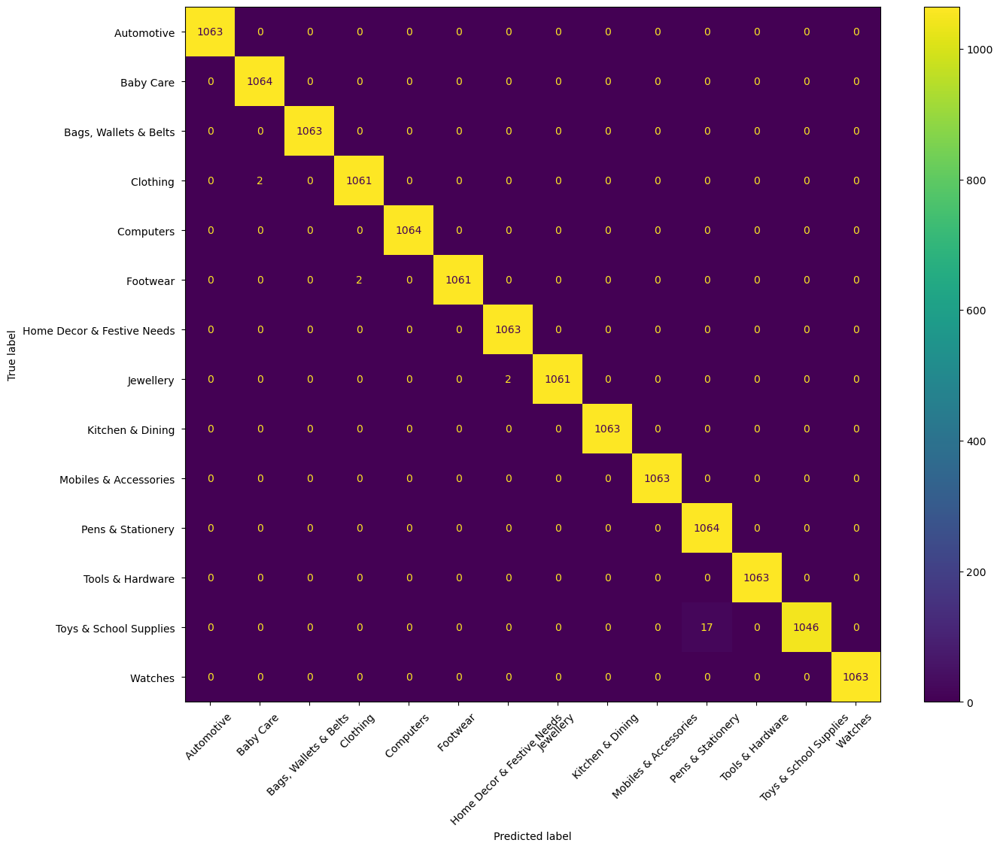

In [98]:
# Compute the confusion matrix
cmlr = confusion_matrix(y_test, y_pred_rf, labels=rf_classifier.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmlr, display_labels=rf_classifier.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "RF_Confusion_Matrix.png"))
plt.show()

##### Classification Report & F1 Score

In [100]:
print("Classification Report:\n", classification_report(y_test, y_pred_rf))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        1.00      1.00      1.00      1063
                 Baby Care        1.00      1.00      1.00      1064
     Bags, Wallets & Belts        1.00      1.00      1.00      1063
                  Clothing        1.00      1.00      1.00      1063
                 Computers        1.00      1.00      1.00      1064
                  Footwear        1.00      1.00      1.00      1063
Home Decor & Festive Needs        1.00      1.00      1.00      1063
                 Jewellery        1.00      1.00      1.00      1063
          Kitchen & Dining        1.00      1.00      1.00      1063
     Mobiles & Accessories        1.00      1.00      1.00      1063
         Pens & Stationery        0.98      1.00      0.99      1064
          Tools & Hardware        1.00      1.00      1.00      1063
    Toys & School Supplies        1.00      0.98      0.99      1063
         

In [101]:
# checking predicted labels
y_pred_rf

array(['Home Decor & Festive Needs ', 'Toys & School Supplies ',
       'Baby Care ', ..., 'Tools & Hardware ', 'Bags, Wallets & Belts ',
       'Jewellery '], dtype=object)

In [102]:
# Checking training accuracy by fitting on the train data
y_predt = rf_classifier.predict(X_train_vectors)

accuracy = accuracy_score(y_train, y_predt)  # y_test should be the labels from the train-test split
print("Accuracy:", accuracy)

Accuracy: 0.9988746871798317


##### Cross Validation Scores

In [104]:
scores = cross_val_score(rf_classifier,X_train_vectors, y_train, cv=5, scoring='accuracy')  # 5-fold cross-validation

In [105]:
scores

array([0.99857239, 0.99840443, 0.99874034, 0.99790057, 0.99798438])

##### Interpretation
High Scores: All scores are very close to 1.0, indicating that this model is consistently predicting nearly all the instances correctly across different subsets of the data.

In [107]:
# calling the update score card method to update the score card with this model's score
update_score_card(y_test,y_pred_rf,'RFC_model')

##### Since the model is already yielding an accuracy of 100% and and F1 Score of 100, there is no need to perform hyperparameter tuning for this model.

### Testing on Upgrad's Test Data

In [110]:
# Loading Upgrad's final test data using pandas's read_csv()
ugt = pd.read_csv("C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/data/rawdata/test_data.csv")

In [111]:
ugt.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,4fb99d98225f415e7ece96938e95628f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/v-v-art-brass-bracelet/p/itme6nyhtzbaqjam?pid=BBAE6NYHCDTEZJTB,V&V ART Brass Bracelet,BBAE6NYHCDTEZJTB,470.0,423.0,"[""http://img6a.flixcart.com/image/bangle-bracelet-armlet/j/t/b/v-v-art-handy-craft-bangles-vb54-2-5-v-v-art-1-original-imae5y84hbgzwkeh.jpeg""]",False,V&V ART Brass Bracelet - Buy V&V ART Brass Bracelet only for Rs. 423 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,No rating available,No rating available,V&V ART,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""VandV ART""}, {""key""=>""Collection"", ""value""=>""Designer""}, {""key""=>""Model Number"", ""value""=>""VandV ART HANDY CRAFT BANGLES (VB54)""}, {""key""=>""Precious/Artificial Jewellery"", ""value""=>""Fashion Jewellery""}, {""key""=>""Type"", ""value""=>""Bracelet""}, {""key""=>""Model Name"", ""value""=>""VB54""}, {""key""=>""Bangle Size"", ""value""=>""Free""}, {""key""=>""Ideal For"", ""value""=>""Women""}, {""key""=>""Occasion"", ""value""=>""Everyday""}, {""key""=>""Color"", ""value""=>""Copper""}, {""key""=>""Diameter"", ""value""=>""2.5 inch""}, {""key""=>""Base Material"", ""value""=>""Brass""}, {""key""=>""Pack of"", ""value""=>""1""}]}"
1,4ea284c8d38b2ea97a1c2a26f34e057c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kalpaveda-copper-cuff/p/itmedffkgguzkykc?pid=BBAEDFFKZJTY7SZZ,Kalpaveda Copper Copper Cuff,BBAEDFFKZJTY7SZZ,1200.0,1200.0,"[""http://img6a.flixcart.com/image/bangle-bracelet-armlet/s/z/z/copper-designer-cuffs-for-women-1-90-kalpaveda-1-1100x1100-imaecazyufezqkhy.jpeg"", ""http://img6a.flixcart.com/image/bangle-bracelet-armlet/s/z/z/copper-designer-cuffs-for-women-1-90-kalpaveda-1-original-imaecazyufezqkhy.jpeg"", ""http://img6a.flixcart.com/image/bangle-bracelet-armlet/s/z/z/copper-designer-cuffs-for-women-1-90-kalpaveda-1-original-imaecazywzmhxhwh.jpeg"", ""http://img5a.flixcart.com/image/bangle-bracelet-armlet/s/z/z/copper-designer-cuffs-for-women-1-90-kalpaveda-1-original-imaecazydgj7vycg.jpeg""]",False,"Kalpaveda Copper Copper Cuff\n Price: Rs. 1,200\n\t\t\t\t\n\t\t\t1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results\n1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results",No rating available,No rating available,Kalpaveda,"{""product_specification""=>[{""key""=>""Stretchable"", ""value""=>""No""}, {""key""=>""Adjustable Length"", ""value""=>""Yes""}, {""key""=>""Tags/Charms Attachable"", ""value"

In [112]:
# Keeping only the essential columns which are description and product_category_tree
ugt = ugt[['description']]

In [113]:
ugt.head()

,description
0,V&V ART Brass Bracelet - Buy V&V ART Brass Bracelet only for Rs. 423 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!
1,"Kalpaveda Copper Copper Cuff\n Price: Rs. 1,200\n\t\t\t\t\n\t\t\t1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results\n1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results"
2,"Thelostpuppy Book Cover for Apple iPad Air (Multicolor)\n Price: Rs. 599\n\t\t\t\t\n\t\t\tDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.\nDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers."
3,Riana Copper Copper Bangle - Buy Riana Copper Copper Bangle only for Rs. 649 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!
4,"Inox Jewelry Stainless Steel Cuff\n Price: Rs. 1,222\n\t\t\t\t\n\t\t\tInox Jewelry Is A Popular American Brand That Specializes In Stainless Steel & Alternative Metal Fashion Jewelry. This Product Is An Ideal Choice For Tropical Climates Because It Will Not Oxidize Nor Tarnish (Compared To Silver & Brass) Over Time. Inox Jewelry Is Non-Toxic And Does Not Contain Cancer Causing Agents Such As Lead. Products Are Made With High Quality 316l Stainless Steel That Is Safe On The Skin And For Your Health. Inox Jewelry Follows American Safety Standards And Is Now Available In India. This Product Has Also Gone Through The Ion Plating (Ip) Process Which Is Also Known As Physical Vapor Deposition. The Ion Plating Process Is The Newest And Most Advanced Surface Finishing Technique Used Today To Treat Stainless Steel Jewelry. This Treatment Allows The Jewelry To Have Varying Shades Of Most Tints (Gold, Black, Brown, And Copper Tones Are The Most Popular). During The Ion Plating Process, A Thin Layer Of Condensation (Usually Titanium Nitrate) Is Added To The Base Metal In Vapor Form. This Settles Into The Metal And Leaves The Surface Harder And Brighter. Products That Have Undergone The Ion Plating Process Have Been Tested To Be Eight Times Stronger And Tend To Be More Durable To Wear And Tear When Compared To Other Plating Methods (Such As Electro-Plating/Electro-Coating). It Is Recommended To Avoid Exposing Jewelry To Perfumes, Aerosol Sprays, Harsh Detergents And Ultrasonic Cleaners. Pleas

In [114]:
ugt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2534 entries, 0 to 2533
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   description  2534 non-null   object
dtypes: object(1)
memory usage: 19.9+ KB


In [115]:
# checking for missing values
ugt.isna().sum() / len(df) * 100

description    0.0
dtype: float64

In [116]:
# add a new column for the length of the reveiws
ugt['length']=ugt['description'].apply(lambda x: len(x.split(' ')))

In [117]:
ugt.head()

,description,length
0,V&V ART Brass Bracelet - Buy V&V ART Brass Bracelet only for Rs. 423 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,28
1,"Kalpaveda Copper Copper Cuff\n Price: Rs. 1,200\n\t\t\t\t\n\t\t\t1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results\n1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results",259
2,"Thelostpuppy Book Cover for Apple iPad Air (Multicolor)\n Price: Rs. 599\n\t\t\t\t\n\t\t\tDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.\nDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.",121
3,Riana Copper Copper Bangle - Buy Riana Copper Copper Bangle only for Rs. 649 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,28
4,"Inox Jewelry Stainless Steel Cuff\n Price: Rs. 1,222\n\t\t\t\t\n\t\t\tInox Jewelry Is A Popular American Brand That Specializes In Stainless Steel & Alternative Metal Fashion Jewelry. This Product Is An Ideal Choice For Tropical Climates Because It Will Not Oxidize Nor Tarnish (Compared To Silver & Brass) Over Time. Inox Jewelry Is Non-Toxic And Does Not Contain Cancer Causing Agents Such As Lead. Products Are Made With High Quality 316l Stainless Steel That Is Safe On The Skin And For Your Health. Inox Jewelry Follows American Safety Standards And Is Now Available In India. This Product Has Also Gone Through The Ion Plating (Ip) Process Which Is Also Known As Physical Vapor Deposition. The Ion Plating Process Is The Newest And Most Advanced Surface Finishing Technique Used Today To Treat Stainless Steel Jewelry. This Treatment Allows The Jewelry To Have Varying Shades Of Most Tints (Gold, Black, Brown, And Copper Tones Are The Most Popular). During The Ion Plating Process, A Thin Layer Of Condensation (Usually Titanium Nitrate) Is Added To The Base Metal In Vapor Form. This Settles Into The Metal And Leaves The Surface Harder And Brighter. Products That Have Undergone The Ion Plating Process Have Been Tested To Be Eight Times Stronger And Tend To Be More Durable To Wear And Tear When Compared To Other Plating Methods (Such As Electro-Plating/Electro-Coating). It Is Recommended To Avoid Exposing Jewelry To Perfumes, Aerosol Sprays, Harsh Detergents And Ultra

In [118]:
# Removing stopwords from the descriptions and storing the cleaned description in a different column
ugt["clean_description"]=ugt["description"].apply(lambda x: ' '.join([word for word in x.split() if word not in (STOPWORDS)]))

In [119]:
# apply the function on the clean_description column
ugt['clean_description'] = ugt['clean_description'].apply(text_clean)

In [120]:
# dropping the length column
ugt = ugt.drop('length', axis = 1)

In [121]:
# add back the length of the cleaned descriptions after the cleaned descriptions column
ugt['length']=ugt['clean_description'].apply(lambda x: len(x.split(' ')))

In [122]:
ugt.head()

,description,clean_description,length
0,V&V ART Brass Bracelet - Buy V&V ART Brass Bracelet only for Rs. 423 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,v v art brass bracelet buy v v art brass bracelet rs 423 flipkart com only genuine products 30 day replacement guarantee free shipping cash on delivery,35
1,"Kalpaveda Copper Copper Cuff\n Price: Rs. 1,200\n\t\t\t\t\n\t\t\t1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results\n1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results",kalpaveda copper copper cuff price rs 1 200 1 attract and emit divine consciousness by wearing copper bracelets and cuffs copper is known to have antioxidant properties that help reduce joint pain gain freedom of movement throughout the body 2 all copper products have been verified as 97 pure by intertek 3 copper is a very soft metal therefore we use brass inserts to ensure the products retain their shape and last long 4 ayurveda recommends wearing copper jewellery to benefit from its multiple benefits all the above mentioned health benefits are recommended by ayurveda 5 they have not been verified by a doctor 6 rub the copper product with lemon covered in salt 7 gently wash and wipe off with a soft cloth for sparkling results 1 attract and emit divine consciousness by wearing copper bracelets and cuffs copper is known to have antioxidant properties that help reduce joint pain gain freedom of movement throughout the body 2 all copper products have been verified as 97 pure by intertek 3 copper is a very soft metal therefore we use brass inserts to ensure the products retain their shape and last long 4 ayurveda recommends wearing copper jewellery to benefit from its multiple benefits all the above mentioned health benefits are recommended by ayurveda 5 they have not been verified by a doctor 6 rub the copper product with lemon covered in salt 7 gently wash and wipe off with a soft cloth for sparkling results,282
2,"Thelostpuppy Book Cover for Apple iPad Air (Multicolor)\n Price: Rs. 599\n\t\t\t\t\n\t\t\tDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.\nDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.",thelostpuppy book cover apple ipad air multicolor price rs 599 designed prot

In [123]:
# removing the stop words again because of new words created after applying the text_clean function
ugt["clean_description"]=ugt["clean_description"].apply(lambda x: ' '.join([word for word in x.split() if word not in (STOPWORDS)]))

In [124]:
# apply the text clean function again on the clean_description column
ugt['clean_description'] = ugt['clean_description'].apply(text_clean)

In [125]:
# update the length of the descriptions
ugt['length']=ugt['clean_description'].apply(lambda x: len(x.split(' ')))

In [126]:
ugt.head()

,description,clean_description,length
0,V&V ART Brass Bracelet - Buy V&V ART Brass Bracelet only for Rs. 423 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!,v v art brass bracelet buy v v art brass bracelet rs 423 flipkart com genuine products 30 day replacement guarantee free shipping cash delivery,25
1,"Kalpaveda Copper Copper Cuff\n Price: Rs. 1,200\n\t\t\t\t\n\t\t\t1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results\n1.Attract And Emit Divine Consciousness By Wearing Copper Bracelets And Cuffs. Copper Is Known To Have Antioxidant Properties That Help Reduce Joint Pain. Gain Freedom Of Movement Throughout The Body. 2. All Copper Products Have Been Verified As 97% Pure By Intertek. 3.Copper Is A Very Soft Metal. Therefore, We Use Brass Inserts To Ensure The Products Retain Their Shape And Last Long. 4. Ayurveda Recommends Wearing Copper Jewellery To Benefit From Its Multiple Benefits*.*All The Above Mentioned Health Benefits Are Recommended By Ayurveda. 5.They Have Not Been Verified By A Doctor. 6. Rub The Copper Product With Lemon Covered In Salt. 7. Gently Wash And Wipe Off With A Soft Cloth For Sparkling Results",kalpaveda copper copper cuff price rs 1 200 1 attract emit divine consciousness wearing copper bracelets cuffs copper known antioxidant properties help reduce joint pain gain freedom movement throughout body 2 copper products verified 97 pure intertek 3 copper soft metal therefore use brass inserts ensure products retain shape last long 4 ayurveda recommends wearing copper jewellery benefit multiple benefits mentioned health benefits recommended ayurveda 5 verified doctor 6 rub copper product lemon covered salt 7 gently wash wipe soft cloth sparkling results 1 attract emit divine consciousness wearing copper bracelets cuffs copper known antioxidant properties help reduce joint pain gain freedom movement throughout body 2 copper products verified 97 pure intertek 3 copper soft metal therefore use brass inserts ensure products retain shape last long 4 ayurveda recommends wearing copper jewellery benefit multiple benefits mentioned health benefits recommended ayurveda 5 verified doctor 6 rub copper product lemon covered salt 7 gently wash wipe soft cloth sparkling results,158
2,"Thelostpuppy Book Cover for Apple iPad Air (Multicolor)\n Price: Rs. 599\n\t\t\t\t\n\t\t\tDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.\nDesigned to protect and impress. The Lost Puppy brings you robust mobile covers in all sizes. With the special anti-slip technology this protects your phone in more ways than one. The matte finish and superior quality add elegance, class and sturdiness to the covers.",thelostpuppy book cover apple ipad air multicolor price rs 599 designed protect impress lost puppy brings robust mobile covers sizes special anti slip technology protects phone ways one matte finish superior quality add elegance class sturdiness covers designed protect impress lost puppy brings robust mobile covers sizes special anti slip technology protects phone ways one matte finish superior quality add elegance class stu

In [127]:
# Apply the function to the cleaned product descriptions
ugt['clean_description'] = ugt['clean_description'].apply(remove_duplicate_words)

In [128]:
# update the length of the descriptions after removing duplicate words
ugt['length']=ugt['clean_description'].apply(lambda x: len(x.split(' ')))

In [129]:
ugt = ugt[['clean_description']]

In [130]:
ugt.head()

,clean_description
0,v art brass bracelet buy rs 423 flipkart com genuine products 30 day replacement guarantee free shipping cash delivery
1,kalpaveda copper cuff price rs 1 200 attract emit divine consciousness wearing bracelets cuffs known antioxidant properties help reduce joint pain gain freedom movement throughout body 2 products verified 97 pure intertek 3 soft metal therefore use brass inserts ensure retain shape last long 4 ayurveda recommends jewellery benefit multiple benefits mentioned health recommended 5 doctor 6 rub product lemon covered salt 7 gently wash wipe cloth sparkling results
2,thelostpuppy book cover apple ipad air multicolor price rs 599 designed protect impress lost puppy brings robust mobile covers sizes special anti slip technology protects phone ways one matte finish superior quality add elegance class sturdiness
3,riana copper bangle buy rs 649 flipkart com genuine products 30 day replacement guarantee free shipping cash delivery
4,inox jewelry stainless steel cuff price rs 1 222 popular american brand specializes alternative metal fashion product ideal choice tropical climates oxidize tarnish compared silver brass time non toxic contain cancer causing agents lead products made high quality 316l safe skin health follows safety standards available india also gone ion plating ip process known physical vapor deposition newest advanced surface finishing technique used today treat treatment allows varying shades tints gold black brown copper tones thin layer condensation usually titanium nitrate added base form settles leaves harder brighter undergone tested eight times stronger tend durable wear tear methods electro coating recommended avoid exposing perfumes aerosol sprays harsh detergents ultrasonic cleaners please clean mild soapy water soft brush item imported comes one year limited manufacturer


In [131]:
ugt_sentences = [word_tokenize(description.lower()) for description in ugt['clean_description']]

In [132]:
ugt_sentences

[['v',
  'art',
  'brass',
  'bracelet',
  'buy',
  'rs',
  '423',
  'flipkart',
  'com',
  'genuine',
  'products',
  '30',
  'day',
  'replacement',
  'guarantee',
  'free',
  'shipping',
  'cash',
  'delivery'],
 ['kalpaveda',
  'copper',
  'cuff',
  'price',
  'rs',
  '1',
  '200',
  'attract',
  'emit',
  'divine',
  'consciousness',
  'wearing',
  'bracelets',
  'cuffs',
  'known',
  'antioxidant',
  'properties',
  'help',
  'reduce',
  'joint',
  'pain',
  'gain',
  'freedom',
  'movement',
  'throughout',
  'body',
  '2',
  'products',
  'verified',
  '97',
  'pure',
  'intertek',
  '3',
  'soft',
  'metal',
  'therefore',
  'use',
  'brass',
  'inserts',
  'ensure',
  'retain',
  'shape',
  'last',
  'long',
  '4',
  'ayurveda',
  'recommends',
  'jewellery',
  'benefit',
  'multiple',
  'benefits',
  'mentioned',
  'health',
  'recommended',
  '5',
  'doctor',
  '6',
  'rub',
  'product',
  'lemon',
  'covered',
  'salt',
  '7',
  'gently',
  'wash',
  'wipe',
  'cloth',
  '

In [133]:
# Train a Word2Vec model on your tokenized sentences
word2vec_model2 = Word2Vec(sentences=ugt_sentences, vector_size=100, window=5, min_count=1, workers=4, sg = 1)

In [134]:
word2vec_model2

In [135]:
ugt_vectors = [get_average_word2vec(sentence, word2vec_model2, vector_size=100) for sentence in ugt_sentences]

In [136]:
ugt_vectors

[array([-0.18380862,  0.4859314 , -0.12133913, -0.08923665,  0.46652845,
        -0.11285573,  0.32484004,  0.36739254,  0.3333229 ,  0.02572434,
        -0.2287122 , -0.61961997,  0.3240621 ,  0.48000336, -0.12193503,
        -0.37587705,  0.13319685, -0.72787505, -0.22393271, -0.6629036 ,
         0.39363986, -0.42818627, -0.1187713 ,  0.02954349, -0.22377443,
         0.51806754,  0.05507769, -0.25849053, -0.476384  , -0.28512475,
         0.32104135,  0.07359841, -0.18175656, -0.2567338 , -0.22324422,
         0.16186504,  0.3991169 , -0.30328065,  0.08566216,  0.01899768,
        -0.8657529 , -0.2951709 ,  0.13433464, -0.6015971 ,  0.08924324,
        -0.25316423, -0.30659994,  0.13520442,  0.7672682 ,  0.9008557 ,
        -0.11491468, -0.05521229, -0.07337788,  0.527507  , -0.09561036,
         0.61659914,  0.21108775,  0.47706833, -0.62037116, -0.72919726,
         0.56393105, -0.21359117, -0.26215452, -0.19479674, -0.5396124 ,
         0.13399255, -0.00396694,  0.05957237, -0.2

In [137]:
ugt_npyarray = np.array(ugt_vectors)

In [138]:
ugt_npyarray

array([[-0.18380862,  0.4859314 , -0.12133913, ..., -0.39061135,
        -0.44101685,  0.3715493 ],
       [-0.08742431,  0.24143045, -0.00989809, ..., -0.154016  ,
        -0.00132219,  0.08643235],
       [-0.06196265,  0.73794997, -0.05168177, ..., -0.38552332,
         0.0724387 ,  0.13823861],
       ...,
       [-0.22258638,  0.46552035, -0.11526431, ..., -0.4493695 ,
        -0.51559496,  0.45902267],
       [-0.23039071,  0.4686882 , -0.11284752, ..., -0.45242104,
        -0.5130743 ,  0.45172763],
       [-0.22258638,  0.46552035, -0.11526431, ..., -0.4493695 ,
        -0.51559496,  0.45902267]], dtype=float32)

In [139]:
# Make predictions using ugt_npyarray
ugtpredrf = rf_classifier.predict(ugt_npyarray)

In [140]:
ugtpredrf.shape

(2534,)

In [141]:
ugtpredrf

array(['Home Decor & Festive Needs ', 'Home Decor & Festive Needs ',
       'Home Decor & Festive Needs ', ..., 'Home Decor & Festive Needs ',
       'Home Decor & Festive Needs ', 'Home Decor & Festive Needs '],
      dtype=object)

In [142]:
# Loading Upgrad's final test data using pandas's read_csv()
ugt_res = pd.read_csv("C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/data/rawdata/test_results.csv")

In [143]:
ugt_res.head()

,product_category_tree
0,Jewellery
1,Jewellery
2,Mobiles & Accessories
3,Jewellery
4,Jewellery


In [144]:
ugt_resarr = ugt_res.values.ravel()

In [145]:
ugt_resarr.shape

(2534,)

In [146]:
ugt_resarr

array(['Jewellery ', 'Jewellery ', 'Mobiles & Accessories ', ...,
       'Baby Care ', 'Baby Care ', 'Baby Care '], dtype=object)

##### Accuracy

In [148]:
accuracy_score(ugt_resarr, ugtpredrf)  # y_test should be the labels from the train-test split

0.1850828729281768

##### Confusion Matrix

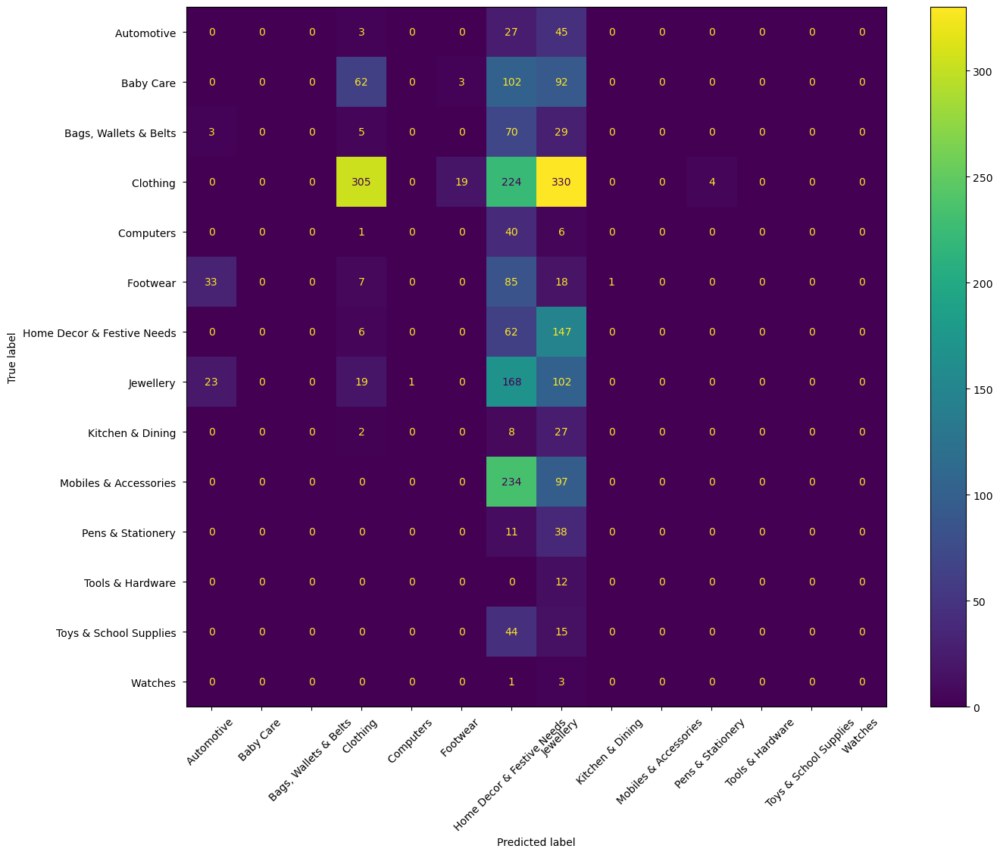

In [150]:
# Compute the confusion matrix
cm = confusion_matrix(ugt_resarr, ugtpredrf, labels=rf_classifier.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf_classifier.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "UGT_RF_Confusion_Matrix.png"))
plt.show()

##### Classification Report

In [152]:
print("Classification Report:\n", classification_report(ugt_resarr, ugtpredrf))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        0.00      0.00      0.00        75
                 Baby Care        0.00      0.00      0.00       259
     Bags, Wallets & Belts        0.00      0.00      0.00       107
                  Clothing        0.74      0.35      0.47       882
                 Computers        0.00      0.00      0.00        47
                  Footwear        0.00      0.00      0.00       144
Home Decor & Festive Needs        0.06      0.29      0.10       215
                 Jewellery        0.11      0.33      0.16       313
          Kitchen & Dining        0.00      0.00      0.00        37
     Mobiles & Accessories        0.00      0.00      0.00       331
         Pens & Stationery        0.00      0.00      0.00        49
          Tools & Hardware        0.00      0.00      0.00        12
    Toys & School Supplies        0.00      0.00      0.00        59
         

##### This model is performing poorly on Upgrad's test data due to various reasons
1) Insufficient Time Provided
2) Never done this extra level of testing on additional test data

#### B] Support Vector Machine Classifier Model

In [155]:
# Initializing the Support Vector Machine Classifier
SVC = LinearSVC()

# Fitting the model on the training data
SVC.fit(X_train_vectors, y_train)

# Obtaining the predictions on the test data
y_pred_svc = SVC.predict(X_test_vectors)

##### Accuracy

In [157]:
#Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test, y_pred_svc) 

0.9583473295263688

##### Confusion Matrix

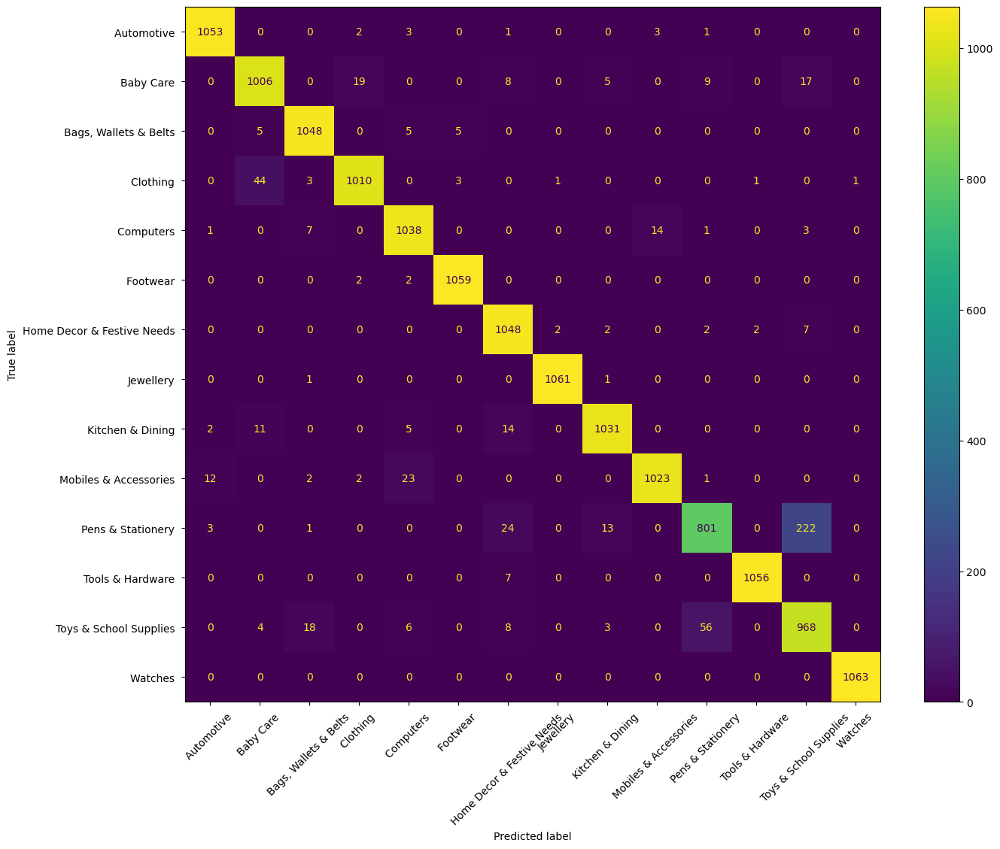

In [159]:
# Compute the confusion matrix
cmlr = confusion_matrix(y_test, y_pred_svc, labels=SVC.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmlr, display_labels=SVC.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "SVC_Confusion_Matrix.png"))
plt.show()

##### Classification Report & F1 Score

In [161]:
print("Classification Report:\n", classification_report(y_test, y_pred_svc))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        0.98      0.99      0.99      1063
                 Baby Care        0.94      0.95      0.94      1064
     Bags, Wallets & Belts        0.97      0.99      0.98      1063
                  Clothing        0.98      0.95      0.96      1063
                 Computers        0.96      0.98      0.97      1064
                  Footwear        0.99      1.00      0.99      1063
Home Decor & Festive Needs        0.94      0.99      0.96      1063
                 Jewellery        1.00      1.00      1.00      1063
          Kitchen & Dining        0.98      0.97      0.97      1063
     Mobiles & Accessories        0.98      0.96      0.97      1063
         Pens & Stationery        0.92      0.75      0.83      1064
          Tools & Hardware        1.00      0.99      1.00      1063
    Toys & School Supplies        0.80      0.91      0.85      1063
         

In [162]:
# calling the update score card method to update the score card with this model's score
update_score_card(y_test,y_pred_svc,'SVC_model')

##### Hyperparameter Tuning

Eventhough we have got an F1 Score of 0.96 there is a little scope of improvement

In [165]:
# defining the hyperparameter grid dictionary
param_grid_svc = {
    'C': [0.01, 0.1, 1, 10, 100]
}

# Set up the grid search
grid_search_svc = GridSearchCV(SVC, param_grid_svc, cv=5, scoring='accuracy')

# This creates a GridSearchCV object that will:
# Perform 5-fold cross-validation (cv=5) to evaluate the Support Vector Classifier (SVC) model's performance.
# Optimize based on accuracy using scoring='accuracy'.
# Search through the hyperparameter grid (param_grid_svc) to find the best combination of parameters for the SVC model.

# Fitting the grid on the training data
grid_search_svc.fit(X_train_vectors, y_train)

# Get and print the best model and parameters
best_svc = grid_search_svc.best_estimator_
print(f"Best parameters: {grid_search_svc.best_params_}")
print(f"Best cross-validation accuracy: {grid_search_svc.best_score_}")


Best parameters: {'C': 100}
Best cross-validation accuracy: 0.964997699814363


In [166]:
# checking the best model
best_svc

LinearSVC(C=100)

In [167]:
# Fitting the best model obtained on the training data
best_svc.fit(X_train_vectors, y_train)

LinearSVC(C=100)

In [168]:
# Obtaining the predictions on the test data
y_pred_bsvc = best_svc.predict(X_test_vectors)

##### Accuracy

In [170]:
# Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test,y_pred_bsvc)

0.9630500503862949

##### Confusion Matrix

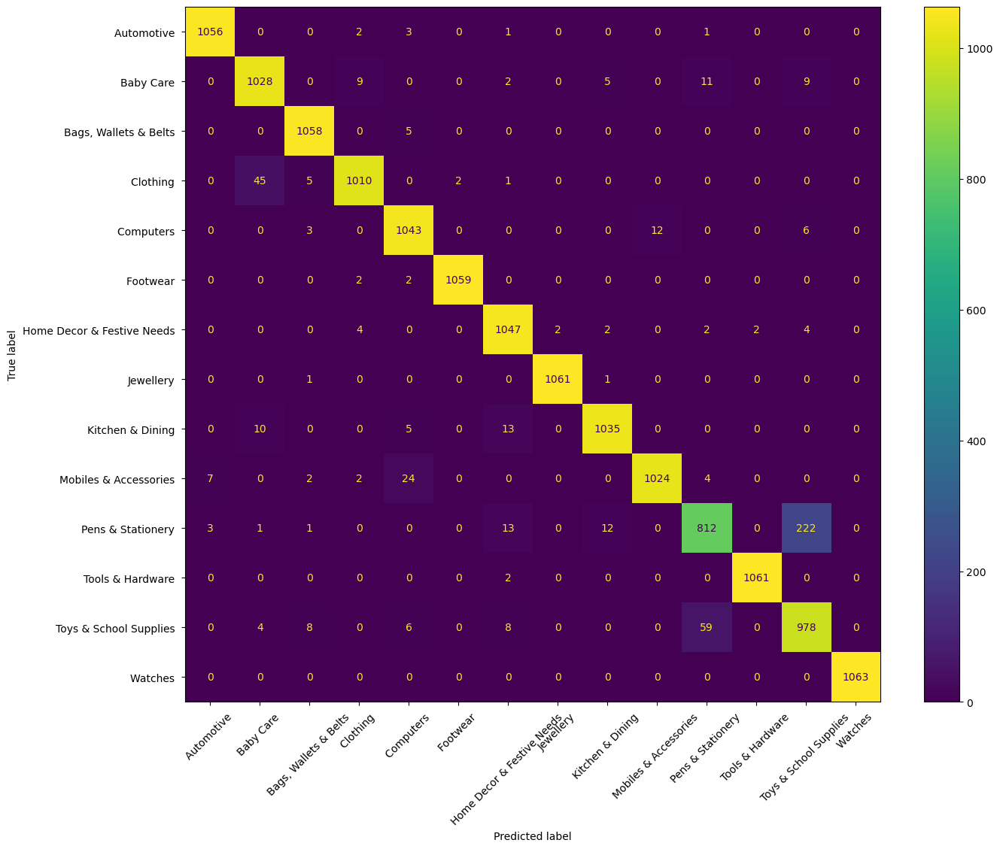

In [172]:
# Compute the confusion matrix
cmbsvc = confusion_matrix(y_test, y_pred_bsvc, labels=best_svc.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmbsvc, display_labels=best_svc.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "Tuned_SVC_Confusion_Matrix.png"))
plt.show()

##### Classification Report & F1 Score

In [174]:
# evaluate the performance of the tuned Support Vector Classifier model on test data using Classification Report
print(classification_report(y_pred_bsvc,y_test))

                             precision    recall  f1-score   support

                Automotive        0.99      0.99      0.99      1066
                 Baby Care        0.97      0.94      0.96      1088
     Bags, Wallets & Belts        1.00      0.98      0.99      1078
                  Clothing        0.95      0.98      0.97      1029
                 Computers        0.98      0.96      0.97      1088
                  Footwear        1.00      1.00      1.00      1061
Home Decor & Festive Needs        0.98      0.96      0.97      1087
                 Jewellery        1.00      1.00      1.00      1063
          Kitchen & Dining        0.97      0.98      0.98      1055
     Mobiles & Accessories        0.96      0.99      0.98      1036
         Pens & Stationery        0.76      0.91      0.83       889
          Tools & Hardware        1.00      1.00      1.00      1063
    Toys & School Supplies        0.92      0.80      0.86      1219
                   Watches       

##### Thus, after performing hyperparameter tuning, the best model is yielding an accuracy slightly more than before.
##### Thus, hyperparameter tuning is improving the accuracy slightly.

##### Cross Validation Scores

In [177]:
scores = cross_val_score(best_svc,X_train_vectors, y_train, cv=5, scoring='accuracy')  # 5-fold cross-validation

In [178]:
scores

array([0.96674505, 0.96657709, 0.96514948, 0.96346994, 0.96304695])

##### Interpretation

High Scores: All scores are quite closer to 1.0, indicating that this model is also consistently predicting nearly all the instances correctly across different subsets of the data.

In [180]:
# calling the update score card method to update the score card with this model's score
update_score_card(y_test,y_pred_bsvc,'BestTuned_SVC_model')

### Testing on Upgrad's Test Data

In [182]:
# Make predictions using ugt_npyarray
ugtpredsvc = best_svc.predict(ugt_npyarray)

In [183]:
ugtpredsvc

array(['Footwear ', 'Home Decor & Festive Needs ',
       'Home Decor & Festive Needs ', ..., 'Footwear ', 'Footwear ',
       'Footwear '], dtype=object)

In [184]:
ugt_resarr

array(['Jewellery ', 'Jewellery ', 'Mobiles & Accessories ', ...,
       'Baby Care ', 'Baby Care ', 'Baby Care '], dtype=object)

##### Accuracy

In [186]:
accuracy_score(ugt_resarr, ugtpredsvc)  # y_test should be the labels from the train-test split

0.06511444356748224

##### Confusion Matrix

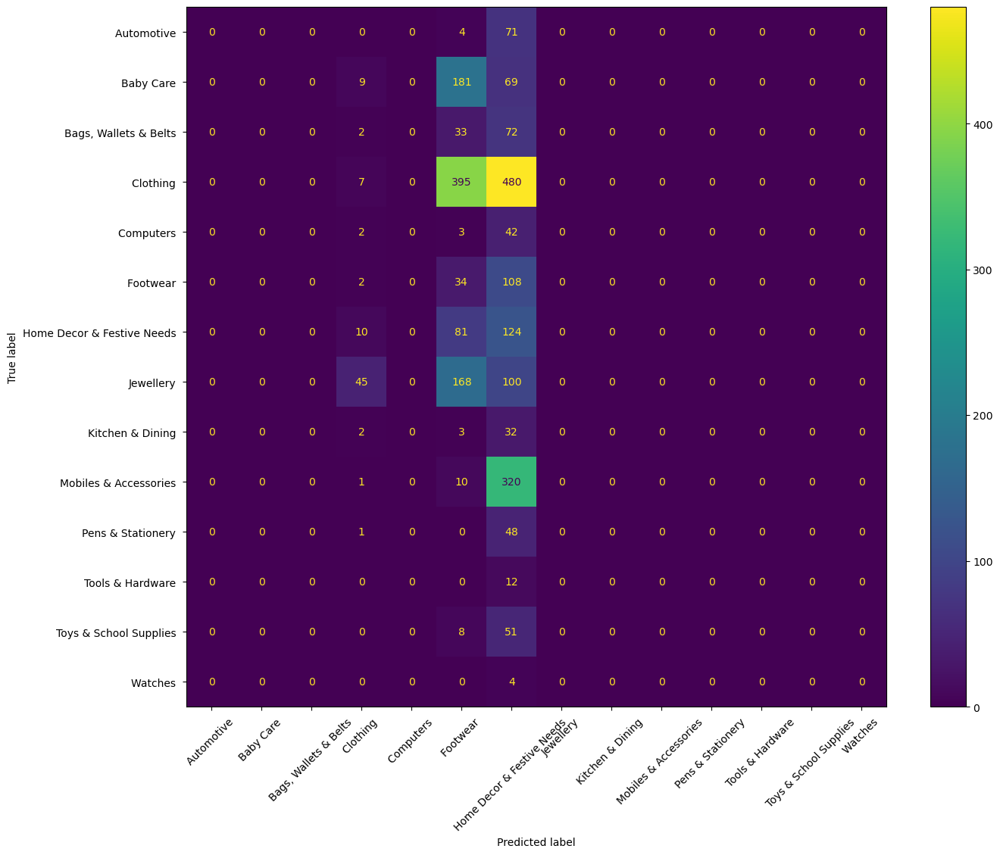

In [188]:
# Compute the confusion matrix
cm = confusion_matrix(ugt_resarr, ugtpredsvc, labels=best_svc.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_svc.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "UGT_SVC_Confusion_Matrix.png"))
plt.show()

##### Classification Report & F1 Score

In [190]:
print("Classification Report:\n", classification_report(ugt_resarr, ugtpredsvc))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        0.00      0.00      0.00        75
                 Baby Care        0.00      0.00      0.00       259
     Bags, Wallets & Belts        0.00      0.00      0.00       107
                  Clothing        0.09      0.01      0.01       882
                 Computers        0.00      0.00      0.00        47
                  Footwear        0.04      0.24      0.06       144
Home Decor & Festive Needs        0.08      0.58      0.14       215
                 Jewellery        0.00      0.00      0.00       313
          Kitchen & Dining        0.00      0.00      0.00        37
     Mobiles & Accessories        0.00      0.00      0.00       331
         Pens & Stationery        0.00      0.00      0.00        49
          Tools & Hardware        0.00      0.00      0.00        12
    Toys & School Supplies        0.00      0.00      0.00        59
         

##### Even this model is performing poorly on Upgrad's test data due to various reasons
1) Insufficient Time Provided
2) Never done this extra level of testing on additional test data

#### C] Logistic Regression Model

In [193]:
# Initializing the Logistic Regression Model
lr = LogisticRegression(class_weight='balanced')
# Fitting the model on the training data
lr.fit(X_train_vectors, y_train)
# Obtaining preditctions on the test data
y_pred_lr = lr.predict(X_test_vectors)

##### Accuracy

In [195]:
# Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test,y_pred_lr)

0.9602284178703393

##### Confusion Matrix

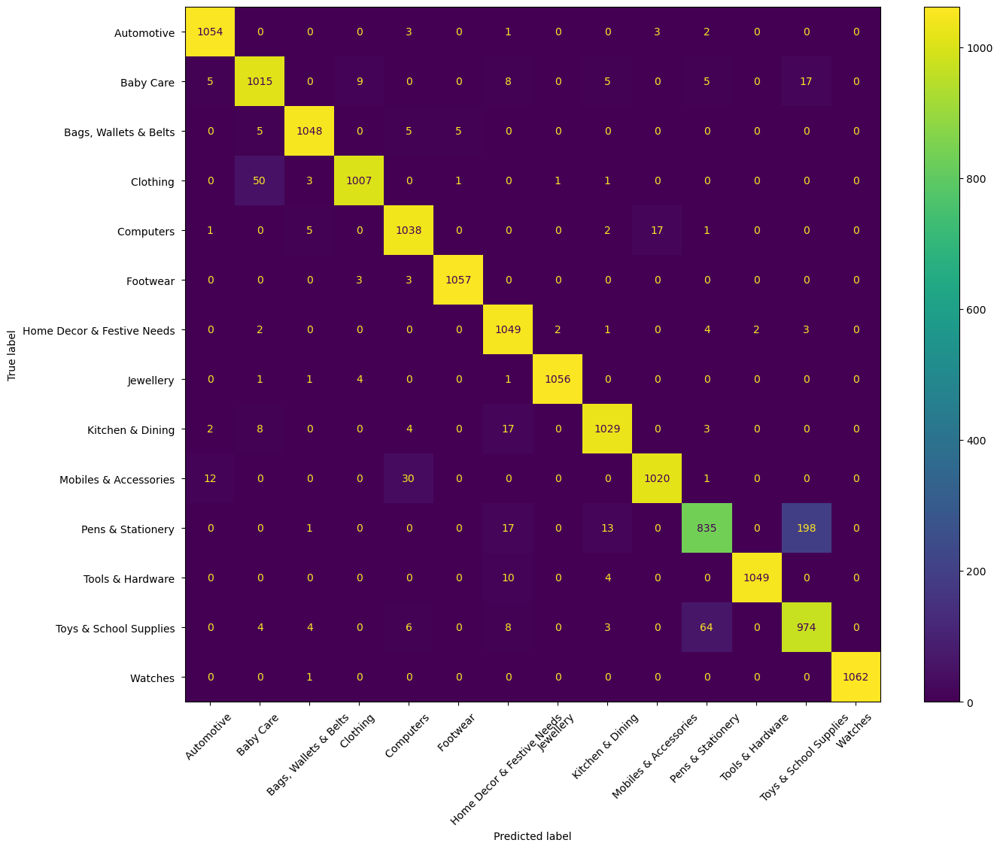

In [197]:
# Compute the confusion matrix
cmblr = confusion_matrix(y_test, y_pred_lr, labels=lr.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmblr, display_labels=lr.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)


# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "LR_Confusion_Matrix.png"))
plt.show()

##### Classifcation Report & F1 Score

In [199]:
print("Classification Report:\n", classification_report(y_test, y_pred_lr))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        0.98      0.99      0.99      1063
                 Baby Care        0.94      0.95      0.94      1064
     Bags, Wallets & Belts        0.99      0.99      0.99      1063
                  Clothing        0.98      0.95      0.97      1063
                 Computers        0.95      0.98      0.96      1064
                  Footwear        0.99      0.99      0.99      1063
Home Decor & Festive Needs        0.94      0.99      0.97      1063
                 Jewellery        1.00      0.99      1.00      1063
          Kitchen & Dining        0.97      0.97      0.97      1063
     Mobiles & Accessories        0.98      0.96      0.97      1063
         Pens & Stationery        0.91      0.78      0.84      1064
          Tools & Hardware        1.00      0.99      0.99      1063
    Toys & School Supplies        0.82      0.92      0.86      1063
         

In [200]:
# calling the update score card method to update the score card with this model's score
update_score_card(y_test,y_pred_lr,'LR_model')

##### Hyperparameter Tuning

Eventhough we have got an F1 Score of 0.96 there is a little scope of improvement

In [203]:
# defining the hyperparameter grid dictionary
param_gridlr = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'newton-cg', 'saga']
}

# Set up the grid search
grid_searchlr = GridSearchCV(lr, param_gridlr, cv=5, scoring='accuracy')
# This creates a GridSearchCV object that will:
# Perform cross-validation with cv=5 (5-fold cross-validation) to evaluate the model’s performance.
# Optimize accuracy using scoring='accuracy'.
# Search over the parameter grid param_gridlr to find the best combination of C and solver for the Logistic Regression model(lr).

# Fitting the grid on the training data
grid_searchlr.fit(X_train_vectors, y_train)

# Obtaining the Best model
best_lr = grid_searchlr.best_estimator_

In [204]:
# checking the best model
best_lr

LogisticRegression(C=100, class_weight='balanced', solver='newton-cg')

In [205]:
# Fitting the best model obtained on the training data
best_lr.fit(X_train_vectors, y_train)
# Obtaining preditctions on the test data
y_pred_blr = best_lr.predict(X_test_vectors)

##### Accuracy

In [207]:
#Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test,y_pred_blr)

0.9828014779979846

##### Confusion Matrix

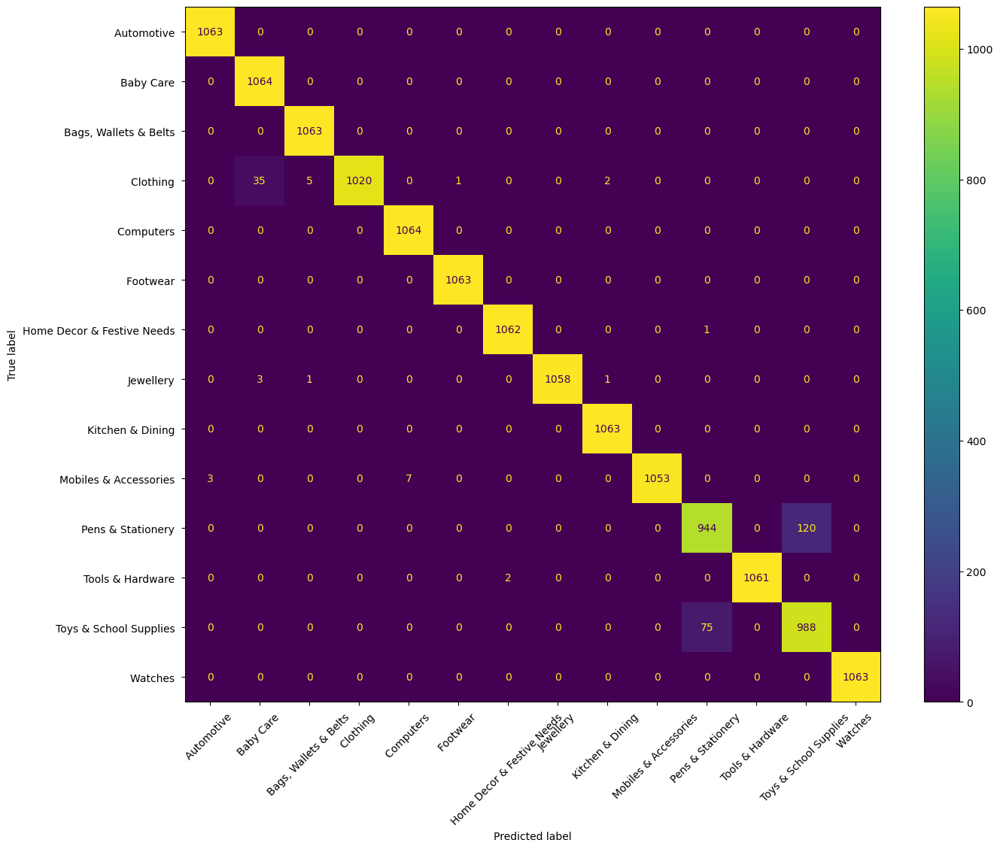

In [209]:
# Compute the confusion matrix
cmblr = confusion_matrix(y_test, y_pred_blr, labels=best_lr.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmblr, display_labels=best_lr.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "Tuned_LR_Confusion_Matrix.png"))
plt.show()

##### Classification Report & F1 Score

In [211]:
print("Classification Report:\n", classification_report(y_test, y_pred_blr))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        1.00      1.00      1.00      1063
                 Baby Care        0.97      1.00      0.98      1064
     Bags, Wallets & Belts        0.99      1.00      1.00      1063
                  Clothing        1.00      0.96      0.98      1063
                 Computers        0.99      1.00      1.00      1064
                  Footwear        1.00      1.00      1.00      1063
Home Decor & Festive Needs        1.00      1.00      1.00      1063
                 Jewellery        1.00      1.00      1.00      1063
          Kitchen & Dining        1.00      1.00      1.00      1063
     Mobiles & Accessories        1.00      0.99      1.00      1063
         Pens & Stationery        0.93      0.89      0.91      1064
          Tools & Hardware        1.00      1.00      1.00      1063
    Toys & School Supplies        0.89      0.93      0.91      1063
         

##### Thus, after performing hyperparameter tuning, the best model is yielding an accuracy which is slightly more than before. 
##### Thus, hyperparameter tuning is effective in improving the accuracy slightly.

##### Cross validation Scores

In [214]:
scores = cross_val_score(best_lr,X_train_vectors, y_train, cv=5, scoring='accuracy')  # 5-fold cross-validation

In [215]:
scores

array([0.98572388, 0.98513604, 0.9863957 , 0.98396036, 0.98639456])

##### Interpretation

High Scores: All scores are very close to 1.0, indicating that this model is also consistently predicting nearly all the instances correctly across different subsets of the data.

In [218]:
# calling the update score card method to update the score card with this model's score
update_score_card(y_test,y_pred_blr,'BestTuned_LR_model')

### Testing on Upgrad's Test Data

In [220]:
# Make predictions using ugt_npyarray
ugtpredlr = best_lr.predict(ugt_npyarray)

In [221]:
# Upgrad's test results
ugt_resarr

array(['Jewellery ', 'Jewellery ', 'Mobiles & Accessories ', ...,
       'Baby Care ', 'Baby Care ', 'Baby Care '], dtype=object)

##### Accuracy

In [223]:
accuracy_score(ugt_resarr, ugtpredlr)  # y_test should be the labels from the train-test split

0.08997632202052092

##### Confusion Matrix

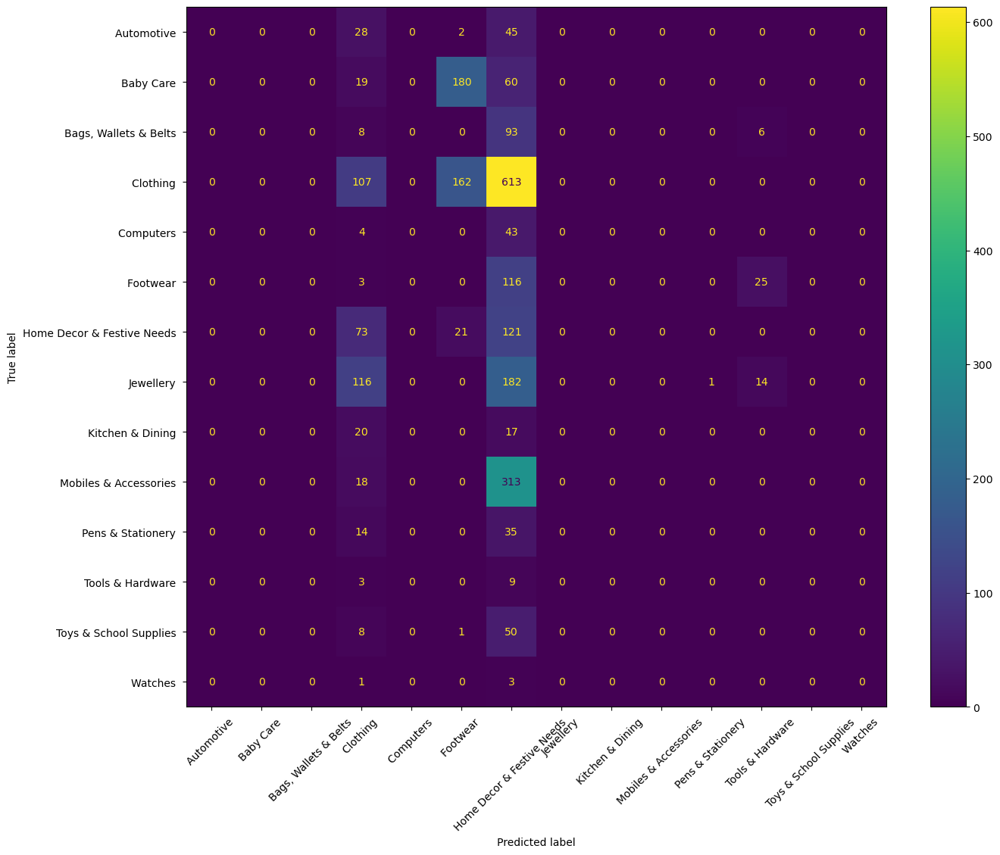

In [225]:
# Compute the confusion matrix
cm = confusion_matrix(ugt_resarr, ugtpredlr, labels=best_lr.classes_)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_lr.classes_)

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "UGT_LR_Confusion_Matrix.png"))
plt.show()


##### Classification Report & F1 Score

In [227]:
print("Classification Report:\n", classification_report(ugt_resarr, ugtpredlr))

Classification Report:
                              precision    recall  f1-score   support

                Automotive        0.00      0.00      0.00        75
                 Baby Care        0.00      0.00      0.00       259
     Bags, Wallets & Belts        0.00      0.00      0.00       107
                  Clothing        0.25      0.12      0.16       882
                 Computers        0.00      0.00      0.00        47
                  Footwear        0.00      0.00      0.00       144
Home Decor & Festive Needs        0.07      0.56      0.13       215
                 Jewellery        0.00      0.00      0.00       313
          Kitchen & Dining        0.00      0.00      0.00        37
     Mobiles & Accessories        0.00      0.00      0.00       331
         Pens & Stationery        0.00      0.00      0.00        49
          Tools & Hardware        0.00      0.00      0.00        12
    Toys & School Supplies        0.00      0.00      0.00        59
         

##### Even this model is performing poorly on Upgrad's test data due to various reasons
1) Insufficient Time Provided
2) Never done this extra level of testing on additional test data

### Deep Learning Approach 

Initially, I had tried using the BERT (Bidirectional Encoder Representations from Transformers) which is a popular pre-trained model and is Excellent at capturing context and relationships between words. But, since it is resource and compute intensive, Google Collab's time limit on free T4 GPU didn't allow me to complete it's training.

#### LSTM (Long Short Term Memory) Model

#### Prepare Data

First, let’s ensure the text data is tokenized and padded to make the sequences uniform for the LSTM. We’ll use TensorFlow and Keras for this setup.

In [266]:
# Tokenize the texts
texts = df_resampled["clean_description"].values
labels = df_resampled["product_category_tree"].values


In [268]:
# Convert labels to numeric format
unique_labels = list(set(labels))
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
numeric_labels = np.array(labels)  # No need to map them

In [270]:
# Check for unexpected values in labels
print("Unique labels in dataset:", set(labels))
print("Label mapping dictionary:", label_mapping)

Unique labels in dataset: {'Computers ', 'Pens & Stationery ', 'Watches ', 'Jewellery ', 'Bags, Wallets & Belts ', 'Footwear ', 'Mobiles & Accessories ', 'Home Decor & Festive Needs ', 'Automotive ', 'Tools & Hardware ', 'Baby Care ', 'Toys & School Supplies ', 'Kitchen & Dining ', 'Clothing '}
Label mapping dictionary: {'Computers ': 0, 'Pens & Stationery ': 1, 'Watches ': 2, 'Jewellery ': 3, 'Bags, Wallets & Belts ': 4, 'Footwear ': 5, 'Mobiles & Accessories ': 6, 'Home Decor & Festive Needs ': 7, 'Automotive ': 8, 'Tools & Hardware ': 9, 'Baby Care ': 10, 'Toys & School Supplies ': 11, 'Kitchen & Dining ': 12, 'Clothing ': 13}


In [274]:
# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(texts, numeric_labels, test_size=0.2, random_state=42)

# Tokenize and pad sequences
vocab_size = 10000 #We can adjust the vocabulary size based on our dataset
max_length = 100  # Length to which each sequence is padded

# Creating a Tokenizer
tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")
tokenizer.fit_on_texts(X_train)

#Parameters:
# num_words=vocab_size: This specifies the maximum number of unique words to keep based on word frequency. Words outside this vocabulary will be ignored. 
# This helps to manage the size of the vocabulary, making the model more efficient.
# oov_token="<OOV>": This defines a token to represent out-of-vocabulary (OOV) words. If the tokenizer encounters a word that is 
# not in the top vocab_size words, it will replace it with this token, ensuring that the model can still process unseen words.

# Fitting the Tokenizer on Training Texts
X_train_seq = pad_sequences(tokenizer.texts_to_sequences(X_train), maxlen=max_length, padding='post')
X_test_seq = pad_sequences(tokenizer.texts_to_sequences(X_test), maxlen=max_length, padding='post')

# tokenizer.texts_to_sequences(X_train): This method converts each text in X_train to a sequence of integers based on the word index created 
# during the fitting process. Each word in the text is replaced by its corresponding integer value.

# pad_sequences(...): This function ensures that all sequences have the same length (maxlen):

# maxlen=max_length: This sets the maximum length of the sequences. If a sequence is longer than this, it will be truncated. 
# If it is shorter, it will be padded.
# padding='post': This specifies that the padding (zeros) should be added at the end of the sequences. We can also use 'pre' to pad at the beginning.

# Convert labels to categorical
label_encoder = LabelEncoder()

# Fit and transform the labels
y_train_int = label_encoder.fit_transform(y_train)
y_test_int = label_encoder.transform(y_test)  # Only transform for the test set

# Convert integer labels to one-hot encoded format
y_train_cat = to_categorical(y_train_int, num_classes=len(unique_labels))
y_test_cat = to_categorical(y_test_int, num_classes=len(unique_labels))

#### Build the LSTM Model

Now, we’ll define the LSTM model. For text classification, a common structure is an embedding layer, followed by an LSTM layer, and one or more dense layers.

In [278]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout

embedding_dim = 64  # Number of embedding dimensions

lstm_model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_length),
    LSTM(128, return_sequences=True),  # First LSTM layer with return_sequences=True for potential stacking
    Dropout(0.2),
    LSTM(64),  # Second LSTM layer
    Dropout(0.2),
    Dense(len(unique_labels), activation='softmax')  # Output layer with softmax for multi-class classification
])

This piece of code defines a sequential neural network model using Keras, specifically tailored for processing sequential data, such as text. Here’s a breakdown of what each part of the model does:

Sequential: This creates a linear stack of layers. Each layer has weights that can be trained, and the output of one layer becomes the input for the next.

Embedding Layer:

Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_length): This layer converts integer-encoded words (from the vocabulary) into dense vector representations (embeddings).

input_dim: The size of the vocabulary (number of unique tokens).
output_dim: The dimensionality of the embedding space (how many features each word will be represented with).
input_length: The length of input sequences (the number of words in each input).

First LSTM Layer:

LSTM(128, return_sequences=True): This adds an LSTM (Long Short-Term Memory) layer with 128 units.
return_sequences=True: This means that the layer will return the full sequence of outputs for each time step (useful when stacking LSTM layers).
Dropout Layer:

Dropout(0.2): This layer randomly sets 20% of the input units to 0 during training, which helps prevent overfitting by introducing noise and forcing the model to learn robust features.
Second LSTM Layer:

LSTM(64): Another LSTM layer with 64 units. This layer will only return the last output since return_sequences is not set to True.
Dropout Layer:

Another Dropout(0.2) to further mitigate overfitting after the second LSTM layer.
Dense Layer:

Dense(len(unique_labels), activation='softmax'): This layer is the output layer, which has a number of units equal to the number of unique labels in the classification task.
activation='softmax': This activation function is used for multi-class classification problems, as it outputs a probability distribution across the classes.

Summary:
Overall, this model is designed for a text classification task where the input is a sequence of words. It uses embeddings to represent words, two LSTM layers to capture sequential dependencies, dropout layers to prevent overfitting, and a dense output layer with softmax activation for class probabilities.

In [281]:
lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# model.compile(...): This method configures the model for training.

# loss='categorical_crossentropy': This specifies the loss function to use during training.

# categorical_crossentropy is used for multi-class classification problems where the target labels are one-hot encoded. 
# It measures the dissimilarity between the predicted probability distribution and the actual distribution (the true labels).

# optimizer='adam': This specifies the optimization algorithm to use for updating model weights during training.
# Adam is an adaptive learning rate optimization algorithm that's popular for training deep learning models due to its efficiency and effectiveness.

# metrics=['accuracy']: This specifies the metrics to evaluate the model's performance during training and testing.
# Here, accuracy will be calculated and displayed, giving a measure of the model's performance by showing the 
# proportion of correctly predicted instances.


In [283]:
lstm_model.summary()

# model.summary(): This method provides a detailed overview of the model architecture. 

# It displays:
# The layers of the model, including their types, output shapes, and the number of parameters (weights) in each layer.
# A summary of the total number of parameters in the model, distinguishing between trainable and non-trainable parameters.

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

#### Train the Model

In [286]:
epochs = 10
# epochs = 10: This sets the number of times the entire training dataset will be passed through the model during training. 
# An epoch consists of multiple iterations over the dataset, with each iteration updating the model weights based on the loss calculated.

batch_size = 32

# batch_size = 32: This specifies the number of samples that will be processed together before the model updates its weights. 
# In this case, 32 samples will be used in each training iteration. Smaller batch sizes can lead to more frequent updates 
# but may also result in more noise, while larger batch sizes can stabilize training but might require more memory.

history = lstm_model.fit(X_train_seq, y_train_cat, 
                    validation_data=(X_test_seq, y_test_cat),
                    epochs=epochs, 
                    batch_size=batch_size, 
                    verbose=1)


Epoch 1/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 169s 89ms/step - accuracy: 0.0750 - loss: 2.6606 - val_accuracy: 0.0730 - val_loss: 2.6296
Epoch 2/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 199s 107ms/step - accuracy: 0.1295 - loss: 2.4687 - val_accuracy: 0.7559 - val_loss: 0.7190
Epoch 3/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 198s 106ms/step - accuracy: 0.8686 - loss: 0.4461 - val_accuracy: 0.9712 - val_loss: 0.1064
Epoch 4/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 216s 116ms/step - accuracy: 0.9772 - loss: 0.0926 - val_accuracy: 0.9750 - val_loss: 0.0951
Epoch 5/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 210s 113ms/step - accuracy: 0.9890 - loss: 0.0462 - val_accuracy: 0.9944 - val_loss: 0.0244
Epoch 6/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 210s 113ms/step - accuracy: 0.9930 - loss: 0.0301 - val_accuracy: 0.9957 - val_loss: 0.0181
Epoch 7/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 206s 110ms/step - accuracy: 0.9966 - loss: 0.0142 - val_accuracy: 0.9952 - val_loss: 0.0191
Epoch 8/10
1861/1861 ━━━━━━━━━━━━━━━━━━━━ 206s 111ms/step - acc

lstm_model.fit(...): This method trains the model on the provided training data.

X_train_seq: The input data for training, typically the preprocessed training sequences (e.g., word embeddings or token sequences).

y_train_cat: The target labels for the training data, which should be in categorical format (e.g., one-hot encoded).

validation_data=(X_test_seq, y_test_cat): This specifies the validation dataset to evaluate the model's performance after each epoch.

X_test_seq is the input data for validation, and y_test_cat is the corresponding target labels.

epochs=epochs: This indicates how many epochs the model will train for, as defined earlier.

batch_size=batch_size: This sets the batch size for training, as defined earlier.

verbose=1: This controls the amount of output during training. Setting verbose=1 will print progress messages after each epoch, including the loss and 
accuracy for both the training and validation sets.

history: This variable stores the output of the fit method, which contains the training and validation loss and accuracy for each epoch. You can use this information later for analysis, such as plotting the training progress or evaluating the model's performance over epochs.

In summary, this code trains the neural network model for 10 epochs on the training data with a batch size of 32, while also evaluating its performance on a validation set after each epoch. The training history, which includes loss and accuracy metrics, is stored in the history variable for further analysis.

#### Evaluate the Model

In [290]:
# After training, let’s evaluate the model on the test set.

loss, accuracy = lstm_model.evaluate(X_test_seq, y_test_cat, verbose=1)
print(f"Test Accuracy: {accuracy:.4f}")

466/466 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - accuracy: 0.9968 - loss: 0.0101
Test Accuracy: 0.9970


lstm_model.evaluate(...): This method computes the loss and metrics for the given test data.

X_test_seq: The input data for testing, which should be preprocessed in the same way as the training data (e.g., tokenized and embedded).

y_test_cat: The target labels for the test data, which should also be in categorical format (e.g., one-hot encoded).

verbose=1: This controls the output during evaluation. Setting it to 1 will print progress messages, including the loss and accuracy after evaluating the test data.

loss, accuracy: The evaluate method returns the computed loss and the specified metrics (in this case, accuracy) for the test dataset.
loss will be the value of the loss function (in this case, categorical cross-entropy) computed on the test set.
accuracy will represent the proportion of correctly classified instances in the test set.

print(f"Test Accuracy: {accuracy:.4f}")
This line prints the test accuracy to the console, formatted to four decimal places.

f"Test Accuracy: {accuracy:.4f}": This is an f-string in Python that formats the output string. The :.4f format specifier ensures that the accuracy value is displayed with four decimal places.

In summary, this code evaluates the trained model on the test dataset to compute the loss and accuracy, then prints the test accuracy in a formatted string. This helps you understand how well the model generalizes to unseen data.

In [293]:
# generate predictions from the trained LSTM model for the test dataset.
y_pred_lstm = lstm_model.predict(X_test_seq)

466/466 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step


In [295]:
# looking at the predictions
y_pred_lstm

array([[2.0735865e-08, 3.8788035e-05, 7.2142181e-09, ..., 1.2766999e-07,
        3.3989220e-08, 4.5025943e-05],
       [1.0473688e-06, 1.5900362e-06, 2.5285317e-07, ..., 5.9955919e-06,
        2.0720146e-05, 4.8334493e-07],
       [9.9997532e-01, 1.1793215e-07, 3.7548900e-06, ..., 1.1100287e-05,
        1.5772573e-06, 2.0852073e-09],
       ...,
       [3.7274858e-06, 5.2174340e-09, 6.0142513e-05, ..., 9.9992585e-01,
        1.0082373e-06, 7.0223550e-06],
       [2.1521053e-08, 3.6617184e-05, 7.2576527e-09, ..., 1.3900210e-07,
        3.3919935e-08, 4.5132660e-05],
       [2.0193440e-06, 1.1297124e-06, 1.4459752e-07, ..., 2.5822142e-06,
        1.4307534e-05, 2.6503062e-07]], dtype=float32)

In [297]:
# Convert the predicted probabilities to class labels
y_pred_lstm_labels = np.argmax(y_pred_lstm, axis=1)

code explanation
np.argmax(y_pred_lstm, axis=1):

The np.argmax() function from the NumPy library returns the indices of the maximum values along the specified axis.

y_pred_lstm: This is the 2D array of predicted probabilities generated by the LSTM model for each class. axis=1: This specifies that the operation should be performed along the rows. In this case, it means that for each row (each sample), it will find the index of the highest probability across the columns (classes).

y_pred_lstm_labels =:

The result of the np.argmax() operation is assigned to the variable y_pred_lstm_labels. This will be a 1D array containing the class labels corresponding to the highest predicted probabilities for each sample in the test set.

In [300]:
# checking the class labels generated
y_pred_lstm_labels

array([ 3,  7,  0, ..., 11,  3,  7], dtype=int64)

In [302]:
y_test_cat

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [304]:
# Convert the true labels from one-hot encoding to class labels
y_test_labels = np.argmax(y_test_cat, axis=1)

In [306]:
#Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test_labels,y_pred_lstm_labels)

0.9970440040309035

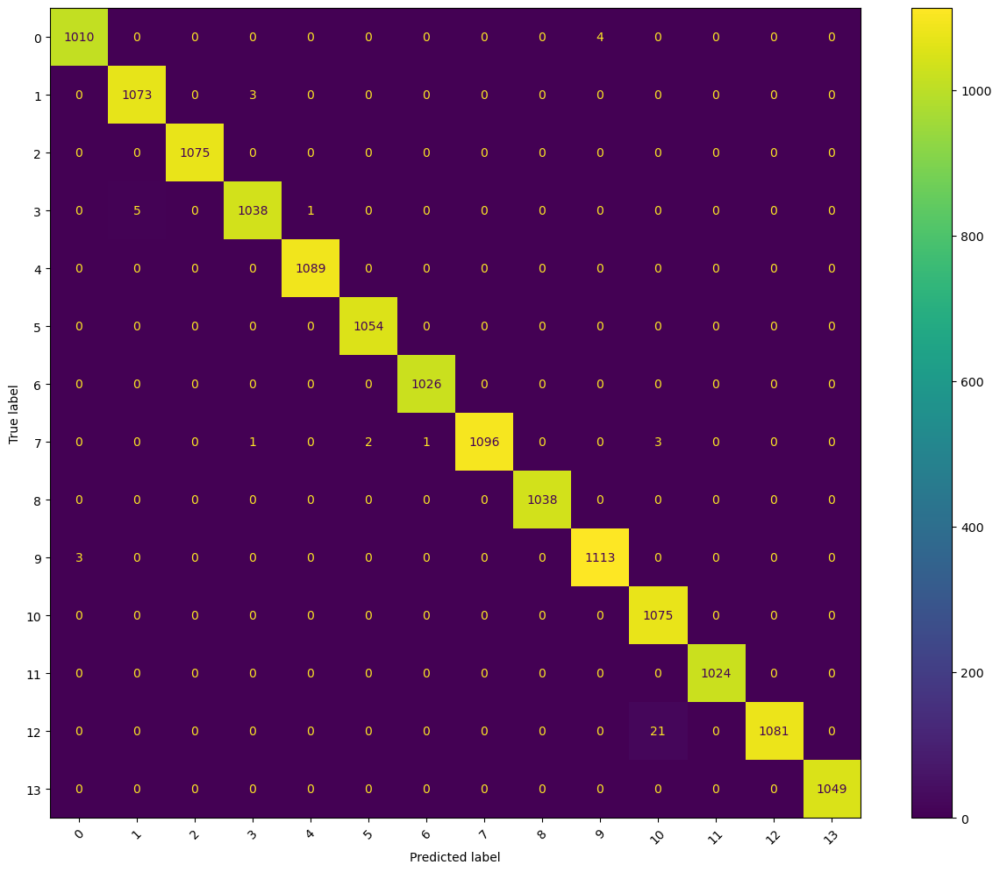

In [308]:
# Compute the confusion matrix
cmlstm = confusion_matrix(y_test_labels,y_pred_lstm_labels)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmlstm, display_labels=np.unique(y_test_labels))

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "LSTM_Confusion_Matrix.png"))
plt.show()

In [310]:
# evaluate the performance of the LSTM model on test data using Classification Report
print(classification_report(y_test_labels,y_pred_lstm_labels))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1014
           1       1.00      1.00      1.00      1076
           2       1.00      1.00      1.00      1075
           3       1.00      0.99      1.00      1044
           4       1.00      1.00      1.00      1089
           5       1.00      1.00      1.00      1054
           6       1.00      1.00      1.00      1026
           7       1.00      0.99      1.00      1103
           8       1.00      1.00      1.00      1038
           9       1.00      1.00      1.00      1116
          10       0.98      1.00      0.99      1075
          11       1.00      1.00      1.00      1024
          12       1.00      0.98      0.99      1102
          13       1.00      1.00      1.00      1049

    accuracy                           1.00     14885
   macro avg       1.00      1.00      1.00     14885
weighted avg       1.00      1.00      1.00     14885



##### Since this model is already yielding an accuracy of around 100%, there is no need to perform hyperparameter tuning for this model.

In [312]:
# calling the update score card method to update the score card with this model's score
update_score_card(y_test_labels,y_pred_lstm_labels,'LSTM_model')

#### Testing on Upgrad's Test Data

In [315]:
# Tokenize the texts
ugttexts = ugt["clean_description"].values
ugtlabels = ugt_res["product_category_tree"].values

In [317]:
# Convert labels to numeric format
unique_labels = list(set(ugtlabels))
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
numeric_labels = np.array(ugtlabels)  # No need to map them

In [319]:
# Check for unexpected values in labels
print("Unique labels in dataset:", set(ugtlabels))
print("Label mapping dictionary:", label_mapping)


Unique labels in dataset: {'Computers ', 'Pens & Stationery ', 'Watches ', 'Jewellery ', 'Mobiles & Accessories ', 'Footwear ', 'Bags, Wallets & Belts ', 'Baby Care ', 'Home Decor & Festive Needs ', 'Toys & School Supplies ', 'Automotive ', 'Tools & Hardware ', 'Kitchen & Dining ', 'Clothing '}
Label mapping dictionary: {'Computers ': 0, 'Pens & Stationery ': 1, 'Watches ': 2, 'Jewellery ': 3, 'Mobiles & Accessories ': 4, 'Footwear ': 5, 'Bags, Wallets & Belts ': 6, 'Baby Care ': 7, 'Home Decor & Festive Needs ': 8, 'Toys & School Supplies ': 9, 'Automotive ': 10, 'Tools & Hardware ': 11, 'Kitchen & Dining ': 12, 'Clothing ': 13}


In [321]:
X_test_seq = pad_sequences(tokenizer.texts_to_sequences(ugt['clean_description']), maxlen=max_length, padding='post')

In [323]:
X_test_seq

array([[ 341,   42,  279, ...,    0,    0,    0],
       [   1,  842, 3987, ...,    0,    0,    0],
       [1174,  527,   63, ...,    0,    0,    0],
       ...,
       [   3, 3843,   68, ...,    0,    0,    0],
       [   3, 3843,   68, ...,    0,    0,    0],
       [   3, 3843,   68, ...,    0,    0,    0]])

In [325]:
ugt_res.head()

,product_category_tree
0,Jewellery
1,Jewellery
2,Mobiles & Accessories
3,Jewellery
4,Jewellery


In [327]:
ugt_resarr

array(['Jewellery ', 'Jewellery ', 'Mobiles & Accessories ', ...,
       'Baby Care ', 'Baby Care ', 'Baby Care '], dtype=object)

In [329]:
# Step 1: Initialize the label encoder
label_encoder = LabelEncoder()

# Step 2: Fit and transform the product_category_tree column to integer labels
integer_encoded = label_encoder.fit_transform(ugt_res['product_category_tree'])


In [331]:
# Step 3: Convert integer labels to one-hot encoded format
y_test_cat = to_categorical(integer_encoded, num_classes=len(unique_labels))

In [333]:
y_test_cat

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [335]:
# let’s evaluate the model on the upgrad test set.
loss, accuracy = lstm_model.evaluate(X_test_seq, y_test_cat, verbose=1)
print(f"Test Accuracy: {accuracy:.4f}")

80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8727 - loss: 0.9585
Test Accuracy: 0.7672


In [337]:
# generate predictions from the trained LSTM model for the test dataset.
y_pred_lstm = lstm_model.predict(X_test_seq)

80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


In [339]:
# looking at the predictions
y_pred_lstm

array([[2.3801085e-06, 2.3458422e-06, 1.8547719e-07, ..., 3.1080324e-06,
        1.8946450e-05, 4.6320571e-07],
       [1.9825588e-05, 4.0428113e-05, 1.1797503e-06, ..., 2.2652962e-06,
        1.5642281e-05, 6.1447199e-06],
       [1.4054091e-08, 7.4615383e-07, 9.2334432e-08, ..., 1.9910065e-09,
        7.8265588e-10, 5.4220074e-08],
       ...,
       [5.4588201e-03, 3.5555702e-05, 3.6624706e-06, ..., 7.7322539e-04,
        5.3685147e-07, 6.5943233e-05],
       [4.4305469e-03, 1.6328475e-05, 1.9122235e-06, ..., 5.0965016e-04,
        3.3325279e-07, 3.3641914e-05],
       [5.4588201e-03, 3.5555702e-05, 3.6624706e-06, ..., 7.7322539e-04,
        5.3685147e-07, 6.5943233e-05]], dtype=float32)

In [341]:
# Convert the predicted probabilities to class labels
y_pred_lstm_labels = np.argmax(y_pred_lstm, axis=1)

# checking the class labels generated
y_pred_lstm_labels

array([7, 7, 9, ..., 6, 6, 6], dtype=int64)

In [343]:
y_test_cat

# Convert the true labels from one-hot encoding to class labels
y_test_labels = np.argmax(y_test_cat, axis=1)


##### Accuracy

In [346]:
#Using accuracy_score() we are checking the accuracy on the testing dataset
accuracy_score(y_test_labels,y_pred_lstm_labels)


0.7671665351223362

##### Confusion Matrix

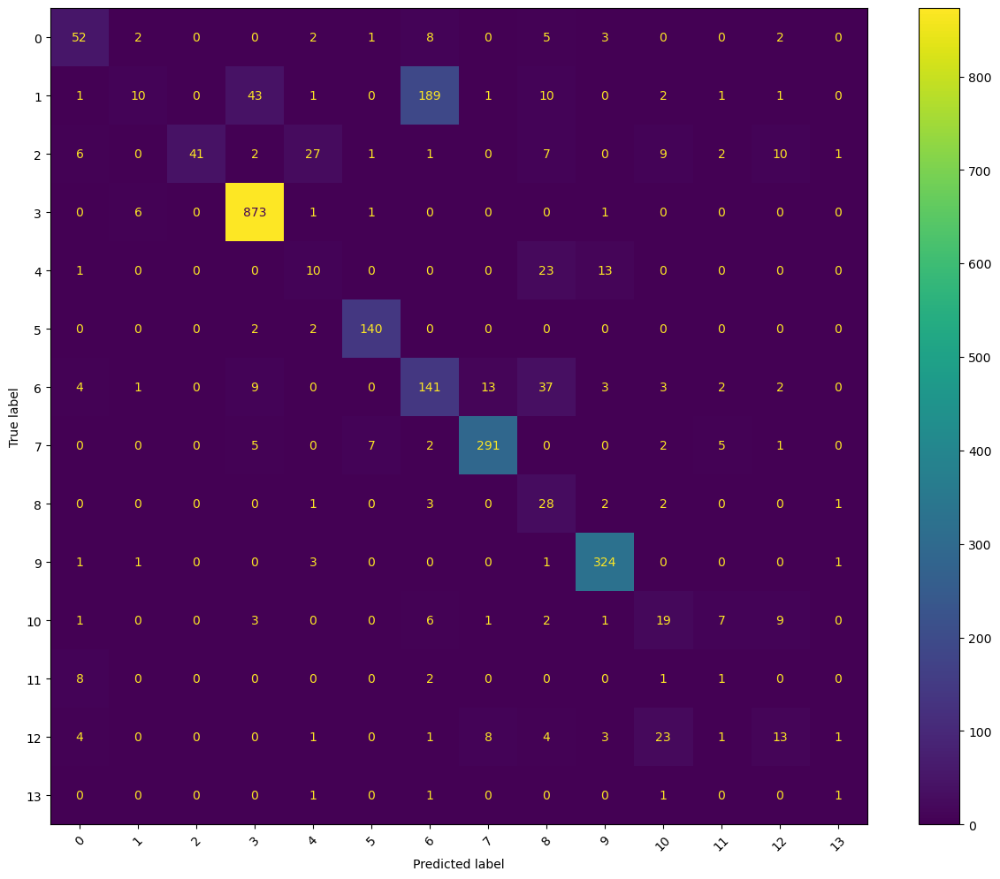

In [349]:
# Compute the confusion matrix
cmlstm = confusion_matrix(y_test_labels,y_pred_lstm_labels)

# Create the ConfusionMatrixDisplay instance
disp = ConfusionMatrixDisplay(confusion_matrix=cmlstm, display_labels=np.unique(y_test_labels))

# Plot the confusion matrix
# Set figure size
plt.figure(figsize=(15, 12))  # Adjust width and height as needed

# Plot the confusion matrix
ax = disp.plot(values_format='d', ax=plt.gca())
plt.xticks(rotation = 45)

# Save the figure automatically
plt.savefig(os.path.join(visuals_folder, "UGT_LSTM_Confusion_Matrix.png"))
plt.show()


##### Classification Report & F1 Score

In [352]:
# evaluate the performance of the LSTM model on the Upgrad's test data using Classification Report
print(classification_report(y_test_labels,y_pred_lstm_labels))

              precision    recall  f1-score   support

           0       0.67      0.69      0.68        75
           1       0.50      0.04      0.07       259
           2       1.00      0.38      0.55       107
           3       0.93      0.99      0.96       882
           4       0.20      0.21      0.21        47
           5       0.93      0.97      0.95       144
           6       0.40      0.66      0.50       215
           7       0.93      0.93      0.93       313
           8       0.24      0.76      0.36        37
           9       0.93      0.98      0.95       331
          10       0.31      0.39      0.34        49
          11       0.05      0.08      0.06        12
          12       0.34      0.22      0.27        59
          13       0.20      0.25      0.22         4

    accuracy                           0.77      2534
   macro avg       0.54      0.54      0.50      2534
weighted avg       0.78      0.77      0.74      2534



In [384]:
# Fit the encoder on your original categorical labels
label_encoder.fit(ugtlabels)

# Now, to convert your numeric predictions back to categorical
y_pred_lstm_labels = label_encoder.inverse_transform(y_pred_lstm_labels)

In [386]:
y_pred_lstm_labels

array(['Jewellery ', 'Jewellery ', 'Mobiles & Accessories ', ...,
       'Home Decor & Festive Needs ', 'Home Decor & Festive Needs ',
       'Home Decor & Festive Needs '], dtype=object)

In [388]:
# Create a DataFrame from the predictions
results_df = pd.DataFrame({
    'Predicted Labels': y_pred_lstm_labels
})

In [390]:
# Save to CSV
results_df.to_csv('predictions.csv', index=False)  # Set index=False to avoid writing row indices

This model is performing well on Upgrad's test data

However, I haven't performed Hyperparamter tuning on this one as I was out of time. 

After Hyperparameter tuning, this model's performance would definitely improve.

#### Ignoring the failure of the models on the Upgrad's test data, here are their performance comparisons 

In [354]:
# Sort the score card by accuracy score in descending order
sorted_score_card = score_card.sort_values(by='f1 Score', ascending=False).reset_index(drop=True)
# Store the top 5 models into final_score_card
final_score_card = sorted_score_card.head()
final_score_card

,model_name,Accuracy Score,Precision Score,Recall Score,f1 Score
0,RFC_model,0.998455,0.998473,0.998455,0.998455
1,LSTM_model,0.997044,0.997080,0.997044,0.997045
2,BestTuned_LR_model,0.982801,0.983003,0.982801,0.982790
3,BestTuned_SVC_model,0.963050,0.964266,0.963050,0.962829
4,LR_model,0.960228,0.961218,0.960228,0.960089


Saving all the models to the models folder¶

Here’s a concise summary of the model performance results:

RFC_model (Random Forest Classifier):

Accuracy: 99.85%
Precision, Recall, F1 Score: 99.85%
Best performing model.
LSTM_model:

Accuracy: 99.70%
Precision, Recall, F1 Score: 99.70%
Strong performance for sequential data.
BestTuned_LR_model (Logistic Regression):

Accuracy: 98.28%
Precision, Recall, F1 Score: 98.28%
Good, but lower than top models.
BestTuned_SVC_model (Support Vector Classifier):

Accuracy: 96.31%
Precision, Recall, F1 Score: 96.28%
Decent performance, but room for improvement.
LR_model (Logistic Regression):

Accuracy: 96.02%
Precision, Recall, F1 Score: 96.01%
Lowest performance; needs further tuning.
Overall Insight:
The Random Forest model is the best option based on accuracy and balanced metrics, while the LSTM also shows excellent performance. The Logistic Regression models, both tuned and untuned, perform well but lag behind the more complex models.

In [357]:
# Define the folder where models will be saved
model_folder = "C:/Users/nikde/Documents/UpGrad/Hackathon/multiclasstextclassification/models"

In [382]:
# Save each model with a different name
joblib.dump(rf_classifier, os.path.join(model_folder, "RFC_model.pkl"))
joblib.dump(SVC, os.path.join(model_folder, "Initial_SVC_model.pkl"))
joblib.dump(best_svc, os.path.join(model_folder, "BestTuned_SVC_model.pkl"))
joblib.dump(lr, os.path.join(model_folder, "Initial_LR_model.pkl"))
joblib.dump(best_lr, os.path.join(model_folder, "BestTuned_LR_model.pkl"))
# Save Keras model separately using model.save()
#lstm_model.save(os.path.join(model_folder, "LSTM_model.h5"))


print("All models saved successfully!")

All models saved successfully!
